# INN Hotels Project

## Project Description

### Context

A significant number of hotel bookings are called-off due to cancellations or no-shows. The typical reasons for cancellations include change of plans, scheduling conflicts, etc. This is often made easier by the option to do so free of charge or preferably at a low cost which is beneficial to hotel guests but it is a less desirable and possibly revenue-diminishing factor for hotels to deal with. Such losses are particularly high on last-minute cancellations.

The new technologies involving online booking channels have dramatically changed customers’ booking possibilities and behavior. This adds a further dimension to the challenge of how hotels handle cancellations, which are no longer limited to traditional booking and guest characteristics.

The cancellation of bookings impact a hotel on various fronts:
* Loss of resources (revenue) when the hotel cannot resell the room.
* Additional costs of distribution channels by increasing commissions or paying for publicity to help sell these rooms.
* Lowering prices last minute, so the hotel can resell a room, resulting in reducing the profit margin.
* Human resources to make arrangements for the guests.

### Objective
The increasing number of cancellations calls for a Machine Learning based solution that can help in predicting which booking is likely to be canceled. INN Hotels Group has a chain of hotels in Portugal, they are facing problems with the high number of booking cancellations and have reached out to your firm for data-driven solutions. You as a data scientist have to analyze the data provided to find which factors have a high influence on booking cancellations, build a predictive model that can predict which booking is going to be canceled in advance, and help in formulating profitable policies for cancellations and refunds.

### Data Description
The data contains the different attributes of customers' booking details. The detailed data dictionary is given below.


### Data Dictionary

* Booking_ID: unique identifier of each booking
* no_of_adults: Number of adults
* no_of_children: Number of Children
* no_of_weekend_nights: Number of weekend nights (Saturday or Sunday) the guest stayed or booked to stay at the hotel
* no_of_week_nights: Number of week nights (Monday to Friday) the guest stayed or booked to stay at the hotel
* type_of_meal_plan: Type of meal plan booked by the customer:
    * Not Selected – No meal plan selected
    * Meal Plan 1 – Breakfast
    * Meal Plan 2 – Half board (breakfast and one other meal)
    * Meal Plan 3 – Full board (breakfast, lunch, and dinner)
* required_car_parking_space: Does the customer require a car parking space? (0 - No, 1- Yes)
* room_type_reserved: Type of room reserved by the customer. The values are ciphered (encoded) by INN Hotels.
* lead_time: Number of days between the date of booking and the arrival date
* arrival_year: Year of arrival date
* arrival_month: Month of arrival date
* arrival_date: Date of the month
* market_segment_type: Market segment designation.
* repeated_guest: Is the customer a repeated guest? (0 - No, 1- Yes)
* no_of_previous_cancellations: Number of previous bookings that were canceled by the customer prior to the current booking
* no_of_previous_bookings_not_canceled: Number of previous bookings not canceled by the customer prior to the current booking
* avg_price_per_room: Average price per day of the reservation; prices of the rooms are dynamic. (in euros)
* no_of_special_requests: Total number of special requests made by the customer (e.g. high floor, view from the room, etc)
* booking_status: Flag indicating if the booking was canceled or not.

## Importing necessary libraries and data

In [1]:
# Installing the libraries with the specified version.
!pip install pandas==1.5.3 numpy==1.25.2 matplotlib==3.7.1 seaborn==0.13.1 scikit-learn==1.2.2 statsmodels==0.14.1 -q --user

In [2]:
pip install --upgrade scikit-learn

  Using cached scikit_learn-1.5.0-cp311-cp311-win_amd64.whl.metadata (11 kB)
Using cached scikit_learn-1.5.0-cp311-cp311-win_amd64.whl (11.0 MB)
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2
Note: you may need to restart the kernel to use updated packages.


In [5]:
# Common Libraries
import numpy as np # linear algebra
import pandas as pd # data manipulation and analysis
import scipy.stats as stats # mathematical algorithms and convenience functions
import statsmodels.stats.multicomp as stats_sm # statistical models, statistical tests, and statistical data exploration
import statsmodels.stats.proportion as stats_sp # statistical models, statistical tests, and statistical data exploration
import matplotlib.pyplot as plt # data visualization
import seaborn as sns # data visualization
import pylab # for QQ plots
from scipy.stats import zscore

# Command to tell Python to actually display the graphs
%matplotlib inline 
sns.set_style('whitegrid') # set style for visualization
import warnings # ignore warnings
warnings.filterwarnings('ignore')
pd.set_option('display.float_format', lambda x: '%.2f' % x) # To supress numerical display in scientific notations

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)

#To build linear regression_model
from sklearn.linear_model import LinearRegression
from statsmodels.tools.tools import add_constant
import statsmodels.api as sm
#For randomized data splitting
from sklearn.model_selection import train_test_split
#To check linear model performance
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
#To check multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor
#To check Heteroscedasticity
import statsmodels.stats.api as sms
from statsmodels.compat import lzip


#To build logostic regression_model
from sklearn.linear_model import LogisticRegression
#For randomized data splitting
from sklearn.model_selection import train_test_split
# To get diferent metric scores
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    ConfusionMatrixDisplay,
    precision_recall_curve,
    roc_curve,
)

#To build CART model
from sklearn.tree import DecisionTreeClassifier #for classification
from sklearn.tree import DecisionTreeRegressor #for Regression
from sklearn import tree
#For randomized data splitting
from sklearn.model_selection import train_test_split
# To tune different models
from sklearn.model_selection import GridSearchCV
# To get diferent metric scores
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    #plot_confusion_matrix,
    make_scorer,
)




**Note**: *After running the above cell, kindly restart the notebook kernel and run all cells sequentially from the start again.*

In [124]:
path1='C:\\Users\\otroc\\OneDrive\\Documents\\Carlos\\Training\\DSBA\\Python\\Jupyter Notebooks\\Module4_Project\\INNHotelsGroup.csv'
data = pd.read_csv(path1)

## Data Overview

- Observations
- Sanity checks

In [125]:
print("There are", data.shape[0], 'rows and', data.shape[1], "columns.")

There are 36275 rows and 19 columns.


In [126]:
data.head()

,Booking_ID,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,INN00001,2,0,1,2,Meal Plan 1,0,Room_Type 1,224,2017,10,2,Offline,0,0,0,65.00,0,Not_Canceled
1,INN00002,2,0,2,3,Not Selected,0,Room_Type 1,5,2018,11,6,Online,0,0,0,106.68,1,Not_Canceled
2,INN00003,1,0,2,1,Meal Plan 1,0,Room_Type 1,1,2018,2,28,Online,0,0,0,60.00,0,Canceled
3,INN00004,2,0,0,2,Meal Plan 1,0,Room_Type 1,211,2018,5,20,Online,0,0,0,100.00,0,Canceled
4,INN00005,2,0,1,1,Not Selected,0,Room_Type 1,48,2018,4,11,Online,0,0,0,94.50,0,Canceled


In [127]:
data.tail()

,Booking_ID,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
36270,INN36271,3,0,2,6,Meal Plan 1,0,Room_Type 4,85,2018,8,3,Online,0,0,0,167.80,1,Not_Canceled
36271,INN36272,2,0,1,3,Meal Plan 1,0,Room_Type 1,228,2018,10,17,Online,0,0,0,90.95,2,Canceled
36272,INN36273,2,0,2,6,Meal Plan 1,0,Room_Type 1,148,2018,7,1,Online,0,0,0,98.39,2,Not_Canceled
36273,INN36274,2,0,0,3,Not Selected,0,Room_Type 1,63,2018,4,21,Online,0,0,0,94.50,0,Canceled
36274,INN36275,2,0,1,2,Meal Plan 1,0,Room_Type 1,207,2018,12,30,Offline,0,0,0,161.67,0,Not_Canceled


**Notes:**
- There are 36275 rows and 19 columns.
- The variable of interest is "booking_status"

In [128]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36275 entries, 0 to 36274
Data columns (total 19 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Booking_ID                            36275 non-null  object 
 1   no_of_adults                          36275 non-null  int64  
 2   no_of_children                        36275 non-null  int64  
 3   no_of_weekend_nights                  36275 non-null  int64  
 4   no_of_week_nights                     36275 non-null  int64  
 5   type_of_meal_plan                     36275 non-null  object 
 6   required_car_parking_space            36275 non-null  int64  
 7   room_type_reserved                    36275 non-null  object 
 8   lead_time                             36275 non-null  int64  
 9   arrival_year                          36275 non-null  int64  
 10  arrival_month                         36275 non-null  int64  
 11  arrival_date   

**Notes:**
- Most variables are numerical type.
- The categorical variables might require some feature engineering

In [129]:
# Checking for missing values in the data
data.isnull().sum()

Booking_ID                              0
no_of_adults                            0
no_of_children                          0
no_of_weekend_nights                    0
no_of_week_nights                       0
type_of_meal_plan                       0
required_car_parking_space              0
room_type_reserved                      0
lead_time                               0
arrival_year                            0
arrival_month                           0
arrival_date                            0
market_segment_type                     0
repeated_guest                          0
no_of_previous_cancellations            0
no_of_previous_bookings_not_canceled    0
avg_price_per_room                      0
no_of_special_requests                  0
booking_status                          0
dtype: int64

In [130]:
# Checking for duplicate entries in the data
data.duplicated().sum()

0

**Notes:**
- There are no missing values nor duplicated data

In [131]:
# Making a list of all categorical variables
cat_cols = data.select_dtypes(include=['object', 'category']).columns.tolist()

for column in cat_cols:
    print(data[column].value_counts())
    print("-" * 50)
    num_cols = data.select_dtypes(include=np.number).columns.tolist()

INN00001    1
INN24187    1
INN24181    1
INN24182    1
INN24183    1
           ..
INN12086    1
INN12085    1
INN12084    1
INN12083    1
INN36275    1
Name: Booking_ID, Length: 36275, dtype: int64
--------------------------------------------------
Meal Plan 1     27835
Not Selected     5130
Meal Plan 2      3305
Meal Plan 3         5
Name: type_of_meal_plan, dtype: int64
--------------------------------------------------
Room_Type 1    28130
Room_Type 4     6057
Room_Type 6      966
Room_Type 2      692
Room_Type 5      265
Room_Type 7      158
Room_Type 3        7
Name: room_type_reserved, dtype: int64
--------------------------------------------------
Online           23214
Offline          10528
Corporate         2017
Complementary      391
Aviation           125
Name: market_segment_type, dtype: int64
--------------------------------------------------
Not_Canceled    24390
Canceled        11885
Name: booking_status, dtype: int64
--------------------------------------------------

In [132]:
for column in cat_cols:
    print(data[column].value_counts(normalize=True))
    print("-" * 50)
    num_cols = data.select_dtypes(include=np.number).columns.tolist()

INN00001   0.00
INN24187   0.00
INN24181   0.00
INN24182   0.00
INN24183   0.00
           ... 
INN12086   0.00
INN12085   0.00
INN12084   0.00
INN12083   0.00
INN36275   0.00
Name: Booking_ID, Length: 36275, dtype: float64
--------------------------------------------------
Meal Plan 1    0.77
Not Selected   0.14
Meal Plan 2    0.09
Meal Plan 3    0.00
Name: type_of_meal_plan, dtype: float64
--------------------------------------------------
Room_Type 1   0.78
Room_Type 4   0.17
Room_Type 6   0.03
Room_Type 2   0.02
Room_Type 5   0.01
Room_Type 7   0.00
Room_Type 3   0.00
Name: room_type_reserved, dtype: float64
--------------------------------------------------
Online          0.64
Offline         0.29
Corporate       0.06
Complementary   0.01
Aviation        0.00
Name: market_segment_type, dtype: float64
--------------------------------------------------
Not_Canceled   0.67
Canceled       0.33
Name: booking_status, dtype: float64
--------------------------------------------------


**Notes:**
- There are 4 options of meal plans (including No meals option). 
- There are 7 types of rooms labeled Room_type 1 to 7
- Customers are classified into 5 categories: Online, Offline, Corporate, Complementary, and Aviation.
- Sample considers 67% Not_Canceled and 33% Cancelled.

In [133]:
data.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Booking_ID,36275,36275,INN00001,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
no_of_adults,36275.00,NaN,NaN,NaN,1.84,0.52,0.00,2.00,2.00,2.00,4.00
no_of_children,36275.00,NaN,NaN,NaN,0.11,0.40,0.00,0.00,0.00,0.00,10.00
no_of_weekend_nights,36275.00,NaN,NaN,NaN,0.81,0.87,0.00,0.00,1.00,2.00,7.00
no_of_week_nights,36275.00,NaN,NaN,NaN,2.20,1.41,0.00,1.00,2.00,3.00,17.00
type_of_meal_plan,36275,4,Meal Plan 1,27835,NaN,NaN,NaN,NaN,NaN,NaN,NaN
required_car_parking_space,36275.00,NaN,NaN,NaN,0.03,0.17,0.00,0.00,0.00,0.00,1.00
room_type_reserved,36275,7,Room_Type 1,28130,NaN,NaN,NaN,NaN,NaN,NaN,NaN
lead_time,36275.00,NaN,NaN,NaN,85.23,85.93,0.00,17.00,57.00,126.00,443.00
arrival_year,36275.00,NaN,NaN,NaN,2017.82,0.38,2017.00,2018.00,2018.00,2018.00,2018.00


**Notes:**
- Average customer seems to be adults couple withou childrens, for 3 nights (one on weekend)
- Data is from 2018, with year (2017-2018), month (1-12) and day (1-31) as numerical variables.
- Very variable price per room

In [134]:
data.duplicated().sum()

0

In [135]:
# Dropping "Booking_ID" 
data = data.drop(["Booking_ID"], axis=1) 

In [136]:
data.duplicated().sum()

10275

**Notes:**

- Before EDA it's droped the variable "Booking_ID" as considered of no value for further analysis- 
After droping Booking_ID, 10275 "duplicated" samples arises. Those are not duplicates but different bookings with matching features.

In [117]:
#checking data after droping variable
data.head()

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,2,0,1,2,Meal Plan 1,0,Room_Type 1,224,2017,10,2,Offline,0,0,0,65.00,0,Not_Canceled
1,2,0,2,3,Not Selected,0,Room_Type 1,5,2018,11,6,Online,0,0,0,106.68,1,Not_Canceled
2,1,0,2,1,Meal Plan 1,0,Room_Type 1,1,2018,2,28,Online,0,0,0,60.00,0,Canceled
3,2,0,0,2,Meal Plan 1,0,Room_Type 1,211,2018,5,20,Online,0,0,0,100.00,0,Canceled
4,2,0,1,1,Not Selected,0,Room_Type 1,48,2018,4,11,Online,0,0,0,94.50,0,Canceled


## Consolidated notes on Data Overview

- There are 36275 rows and 19 columns.
- The variable of interest is "booking_status"
- Most variables are numerical type.
- The categorical variables might require some feature engineering
- There are no missing values nor duplicated data
- There are 4 options of meal plans (including No meals option). 
- There are 7 types of rooms labeled Room_type 1 to 7
- Customers are classified into 5 categories: Online, Offline, Corporate, Complementary, and Aviation.
- Sample considers 67% Not_Canceled and 33% Cancelled.
- Average customer seems to be adults couple without childrens, for 3 nights (one on weekend)
- Data is from 2018, with arrival_year (2017-2018), arrival_month (1-12) and arrival_day (1-31) as numerical variables.
- Very variable price per room
- Before EDA it's droped the variable "Booking_ID" as considered of no value for further analysis
- After droping Booking_ID, 10275 "duplicated" samples arises. Those are not duplicates but different bookings with matching features.

## Exploratory Data Analysis (EDA)

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Leading Questions**:
1. What are the busiest months in the hotel?
2. Which market segment do most of the guests come from?
3. Hotel rates are dynamic and change according to demand and customer demographics. What are the differences in room prices in different market segments?
4. What percentage of bookings are canceled?
5. Repeating guests are the guests who stay in the hotel often and are important to brand equity. What percentage of repeating guests cancel?
6. Many guests have special requirements when booking a hotel room. Do these requirements affect booking cancellation?

In [118]:
data.duplicated().sum()

10275

#### Univariate Analysis

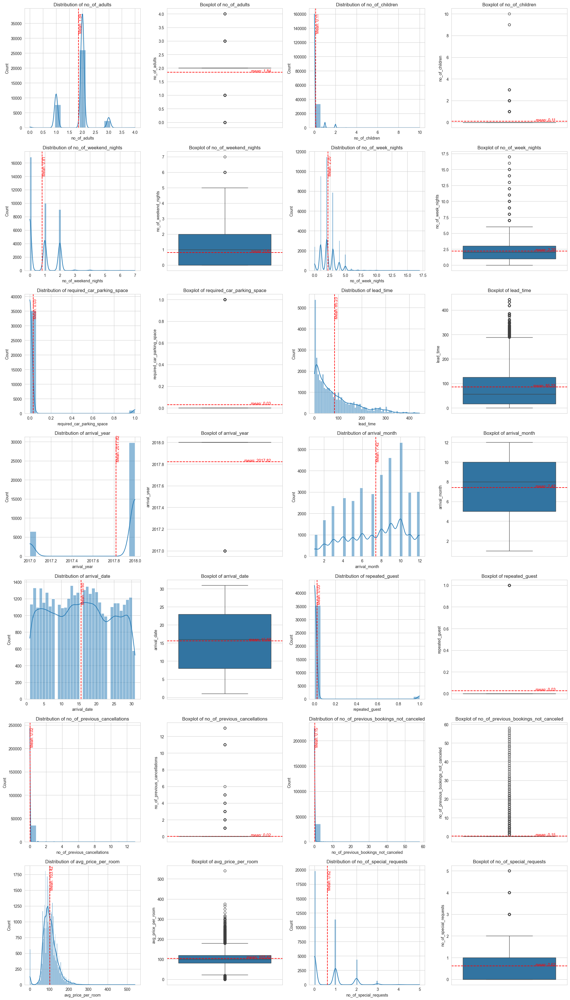

In [16]:
# Select numerical columns
numerical_cols = data.select_dtypes(include=[np.number]).columns

# Determine the number of rows and columns
num_vars = len(numerical_cols)
num_cols = 4
num_rows = int(np.ceil(num_vars * 2 / num_cols))

# Create a figure with the specified size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, num_rows * 5))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plot each variable with a histplot and a boxplot
for i, col in enumerate(numerical_cols):
    mean_value = data[col].mean()
    
    # Histplot with KDE
    sns.histplot(data[col], kde=True, ax=axes[i*2])
    axes[i*2].axvline(mean_value, color='r', linestyle='--')
    axes[i*2].set_title(f'Distribution of {col}')
    axes[i*2].text(mean_value, axes[i*2].get_ylim()[1]*0.8, f'Mean: {mean_value:.2f}', color='r', va='baseline', ha='left',rotation=90)
    
    # Boxplot
    sns.boxplot(y=data[col], ax=axes[i*2 + 1])
    axes[i*2 + 1].axhline(mean_value, color='r', linestyle='--')
    axes[i*2 + 1].set_title(f'Boxplot of {col}')
    axes[i*2 + 1].text(axes[i*2 + 1].get_xlim()[1]*0.8, mean_value, f'mean: {mean_value:.2f}', color='r', va='baseline', ha='right')

# Hide any remaining empty subplots
for j in range(num_vars * 2, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()



**Notes**<br>
- Most common number of adults is 2, and childres is 0, both distributions have few outliers
- Most common number weekend nights is 1, and weekday nigths is 2, with few outliers
- Very few customer require parking space
- leadtime distribution is heavily right-skewed, with a lot of outliers.
- Most of the data is from 2018, with some samples from 2017.
- The busiest months in the hotel are October, September and August
- Very few repeated guest, and relatively few previous booking cancellations and previous bookings not cancelled
- The average price present a distribution similar to normal, right-skewed, with many outliers
- Few special request

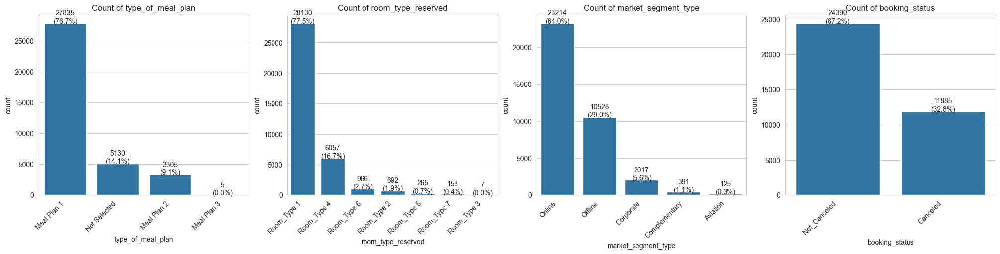

In [17]:
# List of categorical columns
categorical_columns = data.select_dtypes(include=['object', 'category']).columns.tolist()

# Number of columns in the grid
num_cols = 4

# Calculate the number of rows needed
num_rows = (len(categorical_columns) + num_cols - 1) // num_cols

# Create the grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, num_rows * 5), constrained_layout=True)
axes = axes.flatten()

# Plot each countplot in the grid
for i, col in enumerate(categorical_columns):
    ax = axes[i]
    plot = sns.countplot(x=col, data=data, order=data[col].value_counts().index, ax=ax)
    ax.set_title(f'Count of {col}')
       
    # Add total count and percentage annotations
    total = len(data)
    for p in plot.patches:
        height = p.get_height()
        percentage = f'{(height / total * 100):.1f}%'
        plot.text(x=p.get_x() + p.get_width() / 2,
                  y=height + 2,
                  s=f'{height:.0f}\n({percentage})',
                  ha='center')
    
    # Limit x-axis labels to avoid overlap
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

# Remove any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Show the plot
plt.show()


**Notes:**<br>
- The most popular plan meal is Meal Plan 1. The second most selected option is not to hire a plan meal.
- Room type 1 is the most popular room type by far
- The segment type Online is the biggest
- Not canceled booking count is more than double of Canceled booking count.

In [103]:
data.duplicated().sum()

10275

### Bivariate Analysis

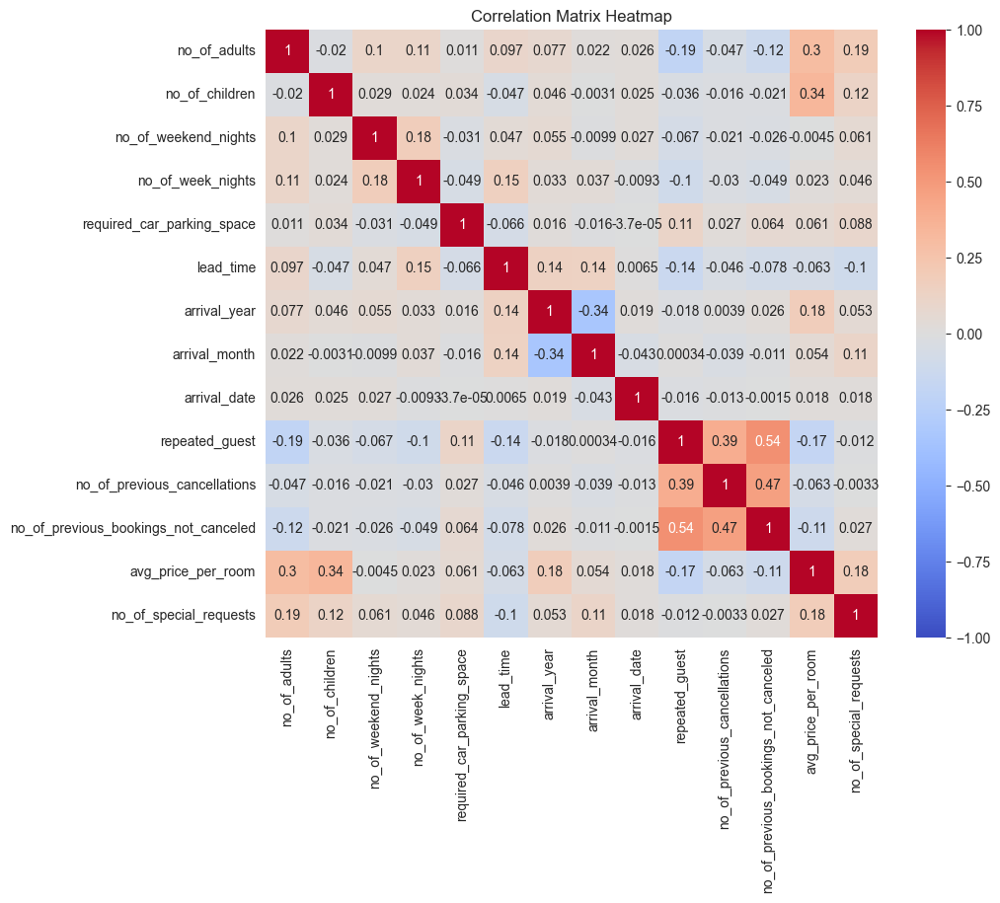

In [18]:
# Calculate correlation matrix
corr_matrix = data.corr()

# Plot correlation matrix as heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix Heatmap')
plt.show()


In [19]:
corr_unstacked = corr_matrix.unstack() # Unstack the correlation matrix
corr_unstacked = corr_unstacked.reset_index() # Reset the index to get 'variable1' and 'variable2' as columns
corr_unstacked.columns = ['variable1', 'variable2', 'correlation']# Rename the columns for better understanding
corr_unstacked = corr_unstacked[corr_unstacked['variable1'] != corr_unstacked['variable2']] # Remove self-correlations by filtering out rows where variable1 == variable2
corr_unstacked = corr_unstacked.drop_duplicates(subset=['correlation']) # Drop duplicates to keep only one entry per variable pair
sorted_corr = corr_unstacked.sort_values(by='correlation', ascending=False) # Sort the DataFrame by the absolute value of correlation
sorted_corr # Display the sorted correlation table

,variable1,variable2,correlation
137,repeated_guest,no_of_previous_bookings_not_canceled,0.54
151,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,0.47
136,repeated_guest,no_of_previous_cancellations,0.39
26,no_of_children,avg_price_per_room,0.34
12,no_of_adults,avg_price_per_room,0.30
13,no_of_adults,no_of_special_requests,0.19
181,avg_price_per_room,no_of_special_requests,0.18
31,no_of_weekend_nights,no_of_week_nights,0.18
96,arrival_year,avg_price_per_room,0.18
47,no_of_week_nights,lead_time,0.15


**Notes**<br>
- repeated_guest have a moderate correlation with no_of_previous_bookings_not_canceled (0.54) and low with no_of_previous_cancellations (0.39)
- no_of_previous_cancellations have have a moderate correlation (0.47) with	no_of_previous_bookings_not_canceled
- avg_price_per_room have a low correlation with no_of_children (0.34) and with no_of_adults (0.30)

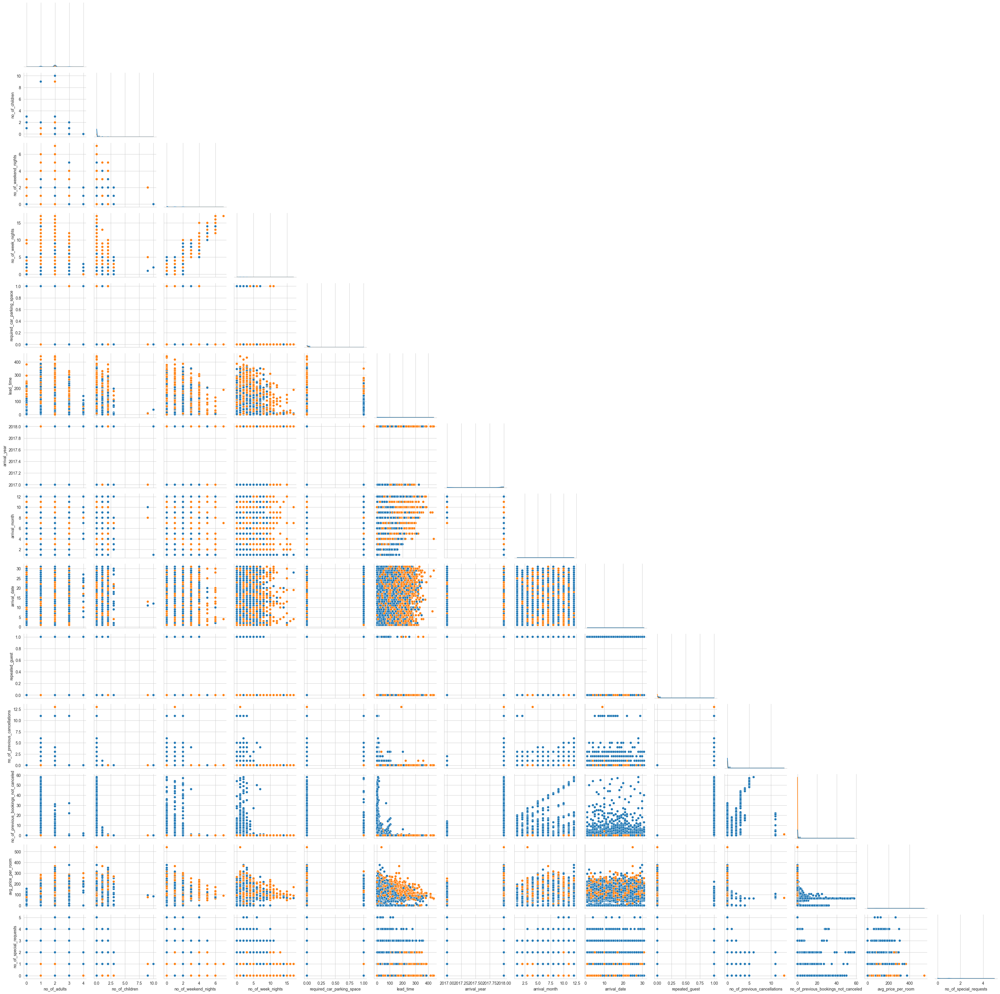

In [20]:
# Create a PairGrid
g = sns.PairGrid(data, hue="booking_status", corner=True)

# Map different plots to the grid
g.map_lower(sns.scatterplot)
g.map_diag(sns.histplot,kde=True)

# Show the plot
plt.show()

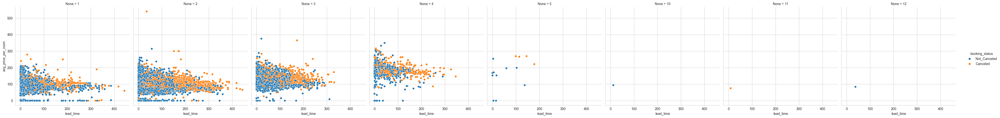

In [21]:
# Create a visualization
sns.relplot(
    data=data,
    x="lead_time", y="avg_price_per_room",hue="booking_status",col=data['no_of_adults']+data['no_of_children'])

In [22]:
group_cancelations= pd.DataFrame(columns=['Group_Size','Not_Canceled', 'Canceled']) #grup being the sum of 'no_of_adults' and 'no_of_children'
for i in range(max(data['no_of_adults']+data['no_of_children'])+1):
    group_cancelations=group_cancelations.append({
        'Group_Size':i,
        'Not_Canceled':data[(data['no_of_adults']+data['no_of_children']==i)&(data['booking_status']=="Not_Canceled")]['booking_status'].value_counts().get('Not_Canceled', 0),
        'Canceled': data[(data['no_of_adults']+data['no_of_children']==i)&(data['booking_status']=="Canceled")]['booking_status'].value_counts().get('Canceled', 0)
    }, ignore_index=True)

group_cancelations

,Group_Size,Not_Canceled,Canceled
0,0,0,0
1,1,5743,1809
2,2,15662,8280
3,3,2459,1392
4,4,514,398
5,5,10,5
6,6,0,0
7,7,0,0
8,8,0,0
9,9,0,0


In [23]:
data[(data['no_of_adults']+data['no_of_children']<5)].groupby(['no_of_adults','no_of_children'])['booking_status'].value_counts()


no_of_adults  no_of_children  booking_status
0             1               Not_Canceled          1
              2               Not_Canceled         89
                              Canceled             44
              3               Not_Canceled          5
1             0               Not_Canceled       5742
                              Canceled           1809
              1               Not_Canceled         67
                              Canceled             23
              2               Not_Canceled         29
                              Canceled             24
2             0               Not_Canceled      15506
                              Canceled           8213
              1               Not_Canceled        991
                              Canceled            511
              2               Not_Canceled        482
                              Canceled            389
3             0               Not_Canceled       1434
                              Cancele

**Notes:**
- Not visible any strong correlation on pairplot, in aligned with correlation heatmap
- The mayority of cancellations comes from groups of two adults and no childrens

In [24]:
def plot_crosstab_grid(df, var_interest):
    # Extract categorical columns excluding the variable of interest
    cat_cols = data.select_dtypes(include=['category', 'object']).columns.tolist()
    cat_cols.remove(var_interest)
    
    # Determine the grid size
    num_vars = len(cat_cols)
    num_cols = 3  # Number of columns in the grid
    num_rows = (num_vars // num_cols) + int(num_vars % num_cols > 0)

    # Create a grid of subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, num_rows * 5), constrained_layout=True)
    axes = axes.flatten()  # Flatten the axes array for easy iteration

    for i, col in enumerate(cat_cols):
        # Create a crosstab
        crosstab = pd.crosstab(df[col], df[var_interest])
        
        # Plot the crosstab as a bar plot
        crosstab.plot(kind='bar', stacked=True, ax=axes[i])
    
    # Hide any remaining empty subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

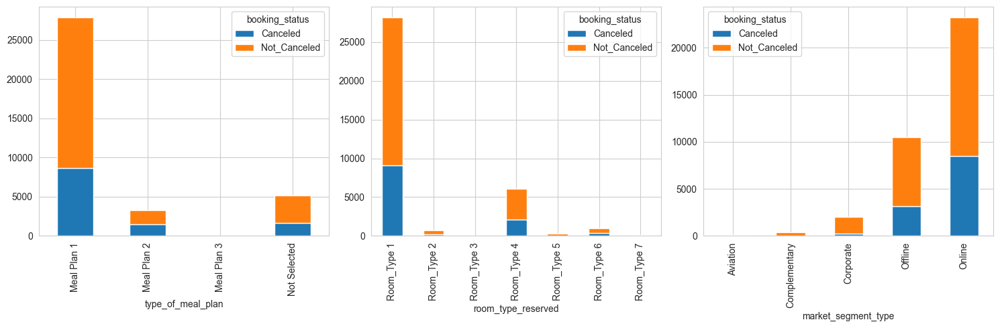

In [25]:
plot_crosstab_grid(data, var_interest='booking_status')

In [26]:
def plot_crosstab_grid(df, var_interest):
    # Extract categorical columns excluding the variable of interest
    cat_cols = data.select_dtypes(include=['category', 'object']).columns.tolist()
    #cat_cols.remove(var_interest)
    
    # Determine the grid size
    num_vars = len(cat_cols)
    num_cols = 3  # Number of columns in the grid
    num_rows = (num_vars // num_cols) + int(num_vars % num_cols > 0)
  
    # Create a grid of subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, num_rows * 5), constrained_layout=True)
    axes = axes.flatten()  # Flatten the axes array for easy iteration

    for i, col in enumerate(cat_cols):
        # Create a crosstab
        crosstab = pd.crosstab(df[col], df[var_interest])
        
        # Plot the crosstab as a bar plot
        crosstab.plot(kind='bar', stacked=True, ax=axes[i])
    
    # Hide any remaining empty subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

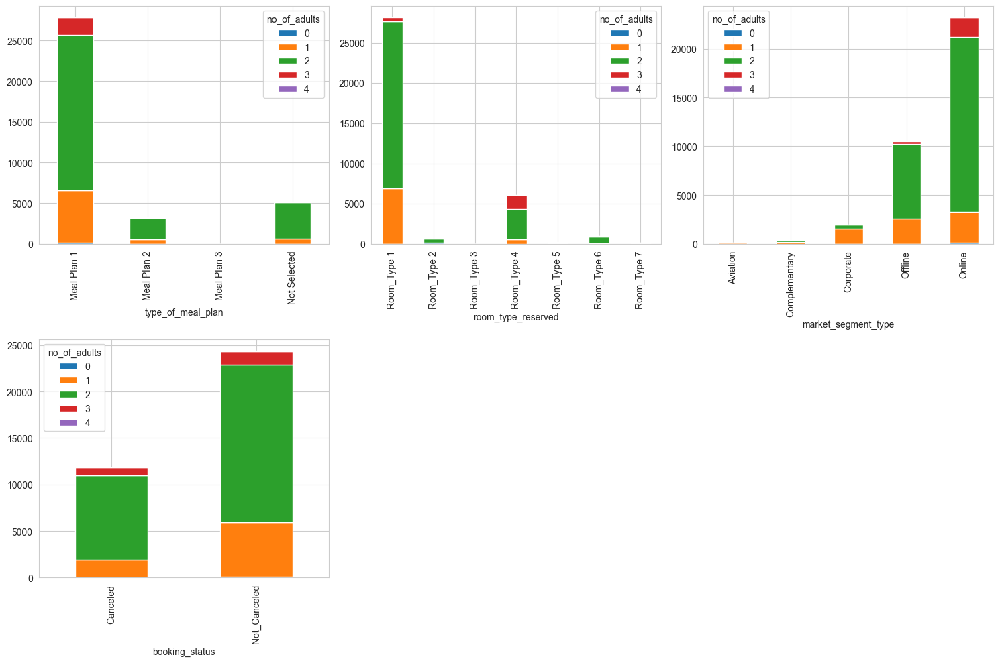

In [27]:
plot_crosstab_grid(data, var_interest='no_of_adults')

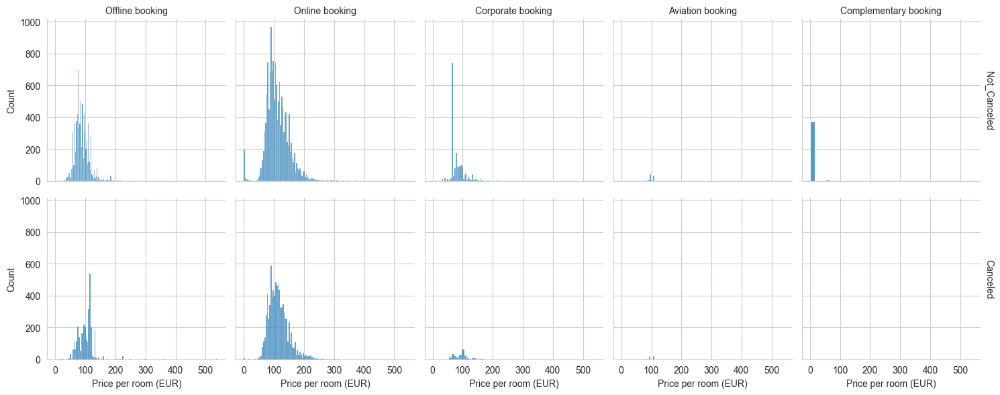

In [28]:
# Initialize the FacetGrid
g = sns.FacetGrid(data, col="market_segment_type", row="booking_status", margin_titles=True)

# Map plots to the grid
g.map(sns.histplot, "avg_price_per_room")

# Customize the plot
g.set_axis_labels('Price per room (EUR)', 'Count')
g.set_titles(col_template="{col_name} booking", row_template="{row_name}")

# Show the plot
plt.show()


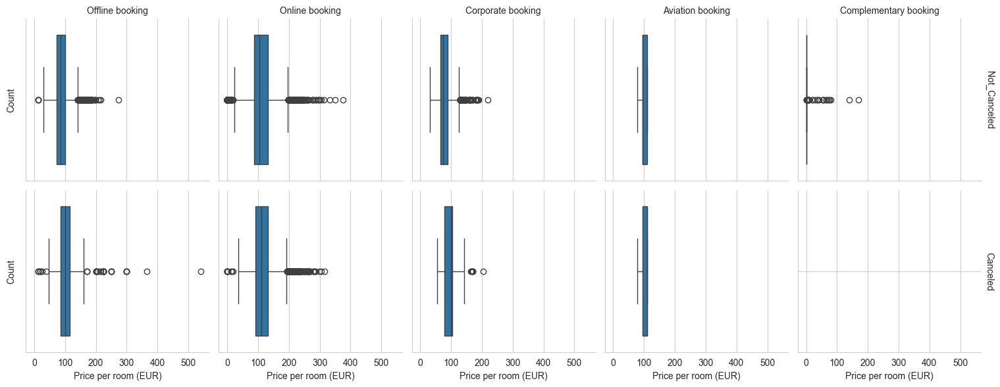

In [29]:
# Initialize the FacetGrid
g = sns.FacetGrid(data, col="market_segment_type", row="booking_status", margin_titles=True)

# Step 2: Map plots to the grid
g.map(sns.boxplot, "avg_price_per_room")

# Customize the plot
g.set_axis_labels('Price per room (EUR)', 'Count')
g.set_titles(col_template="{col_name} booking", row_template="{row_name}")

# Show the plot
plt.show()

In [30]:
data.groupby("market_segment_type")["avg_price_per_room"].mean()

market_segment_type
Aviation        100.70
Complementary     3.14
Corporate        82.91
Offline          91.63
Online          112.26
Name: avg_price_per_room, dtype: float64

In [31]:
data.groupby("market_segment_type")["booking_status"].value_counts(normalize=True)

market_segment_type  booking_status
Aviation             Not_Canceled     0.70
                     Canceled         0.30
Complementary        Not_Canceled     1.00
Corporate            Not_Canceled     0.89
                     Canceled         0.11
Offline              Not_Canceled     0.70
                     Canceled         0.30
Online               Not_Canceled     0.63
                     Canceled         0.37
Name: booking_status, dtype: float64

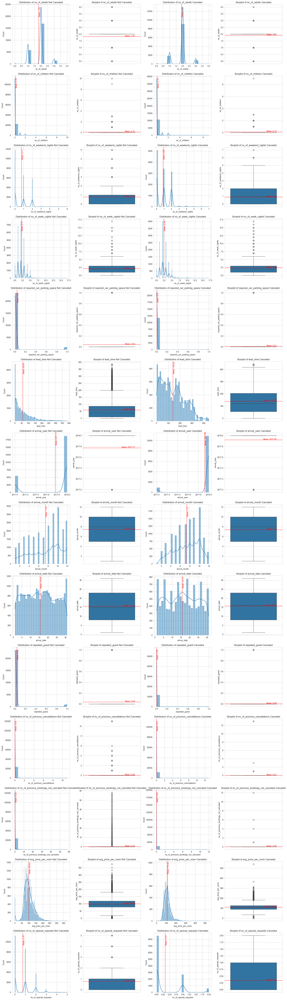

In [32]:
# Select numerical columns
numerical_cols = data.select_dtypes(include=[np.number]).columns

# Determine the number of rows and columns
num_vars = len(numerical_cols)
num_cols = 4
num_rows = int(np.ceil(num_vars * 4 / num_cols))

# Create a figure with the specified size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, num_rows * 5))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plot each variable with a histplot and a boxplot
for i, col in enumerate(numerical_cols):
    mean_value_NC = data[data["booking_status"] == "Not_Canceled"][col].mean()
    mean_value_C = data[data["booking_status"] == "Canceled"][col].mean()
    
    # Histplot with KDE Not_Cancelled
    sns.histplot(data=data[data["booking_status"] == "Not_Canceled"], x=col, kde=True, ax=axes[i*4])
    axes[i*4].axvline(mean_value_NC, color='r', linestyle='--')
    axes[i*4].set_title(f'Distribution of {col} Not Canceled')
    axes[i*4].text(mean_value_NC, axes[i*4].get_ylim()[1]*0.8, f'Mean: {mean_value_NC:.2f}', color='r', va='baseline', ha='left', rotation=90)
    
    # Boxplot Not_Cancelled
    sns.boxplot(y=data[data["booking_status"] == "Not_Canceled"][col], ax=axes[i*4 + 1])
    axes[i*4 + 1].axhline(mean_value_NC, color='r', linestyle='--')
    axes[i*4 + 1].set_title(f'Boxplot of {col} Not Canceled')
    axes[i*4 + 1].text(axes[i*4 + 1].get_xlim()[1]*0.8, mean_value_NC, f'Mean: {mean_value_NC:.2f}', color='r', va='baseline', ha='right')

    # Histplot with KDE Cancelled
    sns.histplot(data=data[data["booking_status"] == "Canceled"], x=col, kde=True, ax=axes[i*4 + 2])
    axes[i*4 + 2].axvline(mean_value_C, color='r', linestyle='--')
    axes[i*4 + 2].set_title(f'Distribution of {col} Canceled')
    axes[i*4 + 2].text(mean_value_C, axes[i*4 + 2].get_ylim()[1]*0.8, f'Mean: {mean_value_C:.2f}', color='r', va='baseline', ha='left', rotation=90)
    
    # Boxplot Cancelled
    sns.boxplot(y=data[data["booking_status"] == "Canceled"][col], ax=axes[i*4 + 3])
    axes[i*4 + 3].axhline(mean_value_C, color='r', linestyle='--')
    axes[i*4 + 3].set_title(f'Boxplot of {col} Canceled')
    axes[i*4 + 3].text(axes[i*4 + 3].get_xlim()[1]*0.8, mean_value_C, f'Mean: {mean_value_C:.2f}', color='r', va='baseline', ha='right')

# Hide any remaining empty subplots
for j in range(num_vars * 4, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()


**Notes**<br>
- Online booking is the dominant segment in number of bookings both cancelled and not cancelled
- The mean lead time for Not Canceled bokings is 58 days, while for Canceled bookings is 139 days.
- The mean price per room for Not Canceled bokings is 99.93 EUR, while for Canceled bookings is 110.59EUR
- The mean no_of_special_requests for Not Canceled bokings is 0.76 requests, while for Canceled bookings is 0.33 requests

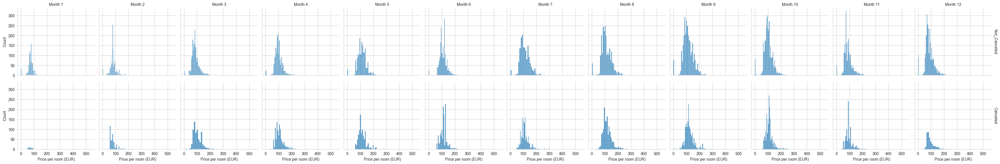

In [33]:

# Initialize the FacetGrid
g = sns.FacetGrid(data, col="arrival_month", row="booking_status", margin_titles=True)

# Map plots to the grid
g.map(sns.histplot, "avg_price_per_room")

# Customize the plot
g.set_axis_labels('Price per room (EUR)', 'Count')
g.set_titles(col_template="Month {col_name}", row_template="{row_name}")

# Show the plot
plt.show()

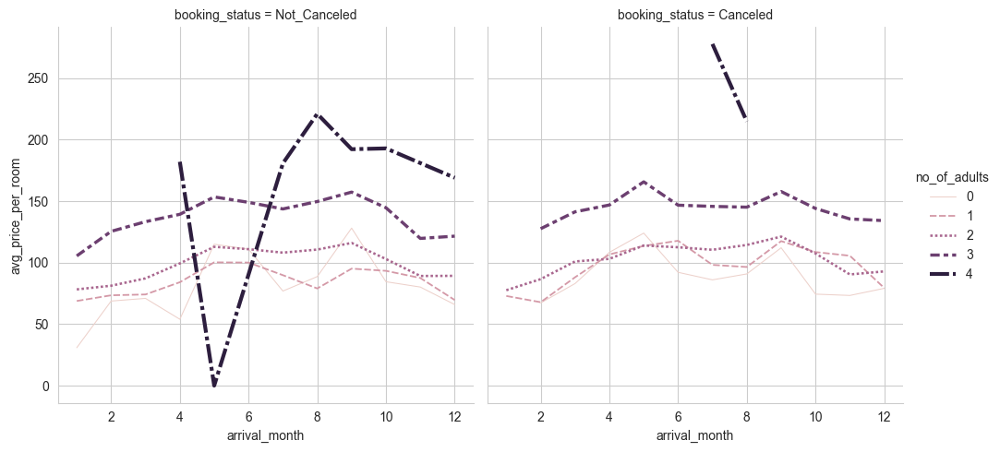

In [34]:
sns.relplot(
    data=data, kind="line",
    x="arrival_month", y="avg_price_per_room", col="booking_status",
    hue="no_of_adults", size="no_of_adults", style="no_of_adults",
    ci=None,
    facet_kws=dict(sharex=False),
)


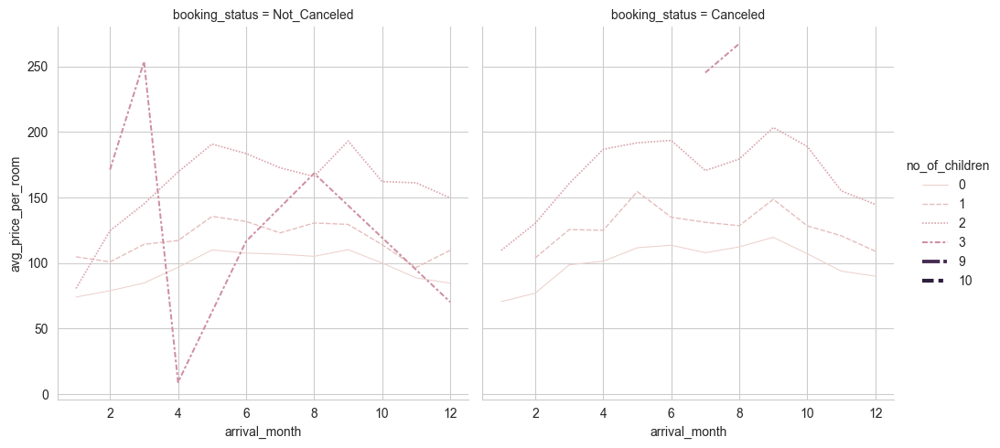

In [35]:
sns.relplot(
    data=data, kind="line",
    x="arrival_month", y="avg_price_per_room", col="booking_status",
    hue="no_of_children", size="no_of_children", style="no_of_children",
    ci=None,
    facet_kws=dict(sharex=False),
)


In [36]:
data[(data["repeated_guest"]==1)]["booking_status"].value_counts(normalize=True)

Not_Canceled   0.98
Canceled       0.02
Name: booking_status, dtype: float64

**Notes**<br>
- Number of adults, number of childrens and special requests des not seem to have impact on booking cancelation
- Price per room have, as expected a seasonality variation with higher prices on months with more bookings
- Price per room is related to the number of adults, being similar for up to 2 adults with a price jumps for 3rd and 4th adult

In [37]:
data.columns

Index(['no_of_adults', 'no_of_children', 'no_of_weekend_nights',
       'no_of_week_nights', 'type_of_meal_plan', 'required_car_parking_space',
       'room_type_reserved', 'lead_time', 'arrival_year', 'arrival_month',
       'arrival_date', 'market_segment_type', 'repeated_guest',
       'no_of_previous_cancellations', 'no_of_previous_bookings_not_canceled',
       'avg_price_per_room', 'no_of_special_requests', 'booking_status'],
      dtype='object')

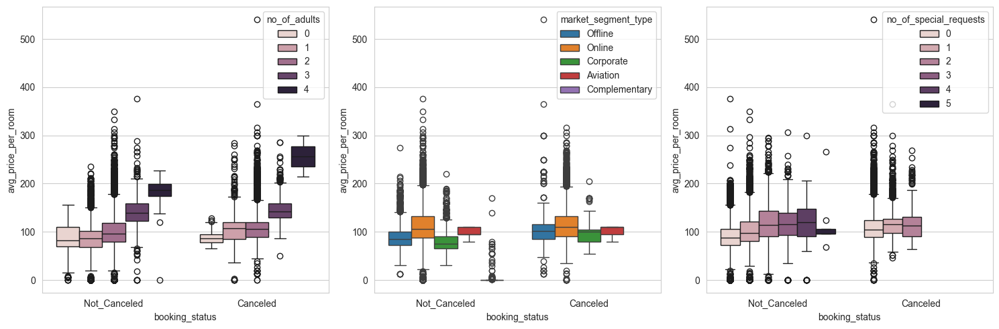

In [38]:
f, axs = plt.subplots(1, 3, figsize=(15, 5),gridspec_kw=dict(width_ratios=[1,1,1]))
sns.boxplot(data, x='booking_status',y='avg_price_per_room', hue='no_of_adults',ax=axs[0]);
sns.boxplot(data, x='booking_status',y='avg_price_per_room', hue='market_segment_type',ax=axs[1]);
sns.boxplot(data, x='booking_status',y='avg_price_per_room', hue='no_of_special_requests',ax=axs[2]);
f.tight_layout()

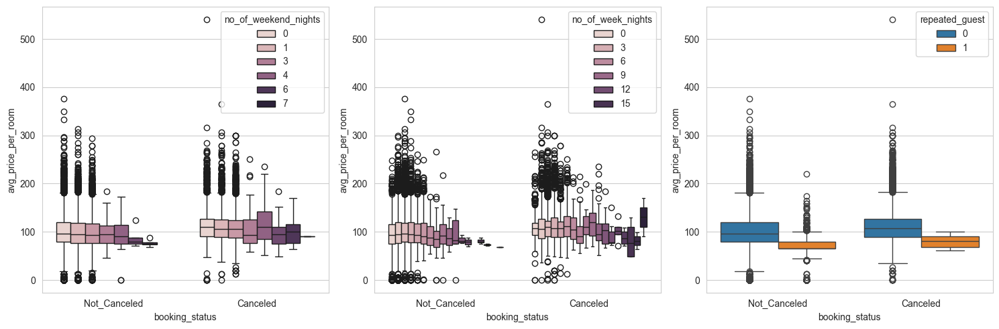

In [39]:
f, axs = plt.subplots(1, 3, figsize=(15, 5),gridspec_kw=dict(width_ratios=[1,1,1]))
sns.boxplot(data, x='booking_status',y='avg_price_per_room', hue='no_of_weekend_nights',ax=axs[0]);
sns.boxplot(data, x='booking_status',y='avg_price_per_room', hue='no_of_week_nights',ax=axs[1]);
sns.boxplot(data, x='booking_status',y='avg_price_per_room', hue='repeated_guest',ax=axs[2]);
f.tight_layout()

**Notes:**
- Price per room tend to increase with number of adults
- Price per room are more expensive Online
- Price of repeated guess is lower than new guests

## Consolidated notes on Exploratory Data Analysis (EDA)

**Univariate Analysis. Numerical**<br>
- Most common number of adults is 2, and childrens is 0, both distributions have few outliers
- Most common number weekend nights is 1, and weekday nigths is 2, with few outliers
- Very few customer require parking space
- leadtime distribution is heavily right-skewed, with a lot of outliers.
- Most of the data is from 2018, with some samples from 2017.
- The busiest months in the hotel are October, September and August
- Very few repeated guest, and relatively few previous booking cancellations and previous bookings not cancelled
- The average price present a distribution similar to normal, right-skewed, with many outliers
- Few special request
  
**Univariate Analysis. Categorical**<br>
- The most popular plan meal is Meal Plan 1. The second most selected option is not to hire a plan meal.
- Room type 1 is the most popular room type by far
- The segment type Online is the biggest
- Not canceled booking count is more than double of Canceled booking count.
  
**Bivariate Analysis**<br>
- repeated_guest have a moderate correlation with no_of_previous_bookings_not_canceled (0.54) and low with no_of_previous_cancellations (0.39)
- no_of_previous_cancellations have have a moderate correlation (0.47) with	no_of_previous_bookings_not_canceled
- avg_price_per_room have a low correlation with no_of_children (0.34) and with no_of_adults (0.30)
- Not visible any strong correlation on pairplot, in aligned with correlation heatmap
- The mayority of cancellations comes from groups of two adults and no childrens
- Online booking is the dominant segment in number of bookings both cancelled and not cancelled
- The mean lead time for Not Canceled bokings is 58 days, while for Canceled bookings is 139 days.
- The mean price per room for Not Canceled bokings is 99.93 EUR, while for Canceled bookings is 110.59EUR
- The mean no_of_special_requests for Not Canceled bokings is 0.76 requests, while for Canceled bookings is 0.33 requests
- Number of adults, number of childrens and special requests des not seem to have impact on booking cancelation
- Price per room have a seasonality variation with higher prices on months with more bookings
- Price per room is related to the number of adults, being similar for up to 2 adults with a price jumps for 3rd and 4th adult
- Price per room tend to increase with number of adults
- Price per room are more expensive Online
- Price of repeated guess is lower than new guests

**Answers**
1. What are the busiest months in the hotel?.<br> **R:** The busiest months in the hotel are October, September and August
2. Which market segment do most of the guests come from?<br> **R:** Online booking is the dominant segment in number of bookings both cancelled and not cancelled
3. Hotel rates are dynamic and change according to demand and customer demographics. What are the differences in room prices in different market segments?<br> **R:**<br>
&emsp;* Aviation        100.70<br>
&emsp;* Complementary     3.14<br>
&emsp;* Corporate        82.91<br>
&emsp;* Offline          91.63<br>
&emsp;* Online          112.26<br>
4. What percentage of bookings are canceled?<br> **R:** Sample considers 67% Not_Canceled and 33% Cancelled.
5. Repeating guests are the guests who stay in the hotel often and are important to brand equity. What percentage of repeating guests cancel? <br> **R:** Only 2% of repeating guests cancel their bookings
6. Many guests have special requirements when booking a hotel room. Do these requirements affect booking cancellation? <br> **R:** It doesn't seem to affect considering the mean no_of_special_requests for Not Canceled bokings is 0.76 requests, while for Canceled bookings is 0.33 requests

## Data Preprocessing

- Missing value treatment (if needed)
- Feature engineering (if needed)
- Outlier detection and treatment (if needed)
- Preparing data for modeling
- Any other preprocessing steps (if needed)

In [40]:
# List of categorical columns
categorical_columns = data.select_dtypes(include=['object', 'category']).columns.tolist()
data[categorical_columns].columns

# Checking if all levels of the categories are appropriately defined
for i in categorical_columns:
    print (i,": ",data[i].unique())

type_of_meal_plan :  ['Meal Plan 1' 'Not Selected' 'Meal Plan 2' 'Meal Plan 3']
room_type_reserved :  ['Room_Type 1' 'Room_Type 4' 'Room_Type 2' 'Room_Type 6' 'Room_Type 5'
 'Room_Type 7' 'Room_Type 3']
market_segment_type :  ['Offline' 'Online' 'Corporate' 'Aviation' 'Complementary']
booking_status :  ['Not_Canceled' 'Canceled']


In [73]:
data.duplicated().sum()

10275

In [41]:
data.columns

Index(['no_of_adults', 'no_of_children', 'no_of_weekend_nights',
       'no_of_week_nights', 'type_of_meal_plan', 'required_car_parking_space',
       'room_type_reserved', 'lead_time', 'arrival_year', 'arrival_month',
       'arrival_date', 'market_segment_type', 'repeated_guest',
       'no_of_previous_cancellations', 'no_of_previous_bookings_not_canceled',
       'avg_price_per_room', 'no_of_special_requests', 'booking_status'],
      dtype='object')

In [42]:
df=data.copy() #creating a copy of the "data" dataframe
df['total_guest']= df['no_of_adults'] + df['no_of_children'] #creating new variable total_guest

In [43]:
df['total_nights'] = df['no_of_weekend_nights'] + df['no_of_week_nights'] #creating new variable total_nights

**Notes:**
- Missing value treatment is not needed, as the data has no missing values.
- Before EDA it was droped the variable "Booking_ID" as considered of no value for further analysis.
- Two new variables to be added:
    - total_guest = no_of_adults + 'no_of_children
    - total_nights = no_of_weekend_nights + no_of_week_nights

In [44]:
# encoding type_of_meal_plan
df['type_of_meal_plan'] = df['type_of_meal_plan'].map({'Meal Plan 1':1, 'Not Selected':0, 'Meal Plan 2':2, 'Meal Plan 3':3})

In [45]:
# encoding room_type_reserved
df['room_type_reserved']=df['room_type_reserved'].map({'Room_Type 1':1, 'Room_Type 4':4, 'Room_Type 2':2, 'Room_Type 6':6, 'Room_Type 5':5,
 'Room_Type 7':7, 'Room_Type 3':3})

In [46]:
# encoding booking_status
df['booking_status']=df['booking_status'].map({'Not_Canceled':0, 'Canceled':1})

**Notes:**
- Encoding:
    - type_of_meal_plan :  Meal Plan 1:1 Not Selected:0 Meal Plan 2:2 Meal Plan 3:
    - room_type_reserved : 'Room_Type 1':1 'Room_Type 4':4 'Room_Type 2':2 'Room_Type 6':6 'Room_Type 5':5 'Room_Type 7':7 'Room_Type 3':3
    - booking_status: 'Not_Canceled':0 'Canceled':1

In [68]:
# function to check for outliers
def count_outliers(df):
    outlier_count=0
    for column in df.select_dtypes(include=np.number).columns:
        outliers=len(df[(df[column] < df[column].quantile(0.25)-1.5*(df[column].quantile(0.75)-df[column].quantile(0.25))) | (df[column] > df[column].quantile(0.75)+1.5*(df[column].quantile(0.75)-df[column].quantile(0.25)))][column])
        print(f'{column}: {outliers} outliers ({outliers/df.shape[0]*100:.2f}%)')
        outlier_count+= outliers
    return outlier_count

In [69]:
count_outliers(df)

no_of_adults: 10167 outliers (28.03%)
no_of_children: 2698 outliers (7.44%)
no_of_weekend_nights: 21 outliers (0.06%)
no_of_week_nights: 324 outliers (0.89%)
type_of_meal_plan: 8440 outliers (23.27%)
required_car_parking_space: 1124 outliers (3.10%)
room_type_reserved: 8145 outliers (22.45%)
lead_time: 1331 outliers (3.67%)
arrival_year: 6514 outliers (17.96%)
arrival_month: 0 outliers (0.00%)
arrival_date: 0 outliers (0.00%)
repeated_guest: 930 outliers (2.56%)
no_of_previous_cancellations: 338 outliers (0.93%)
no_of_previous_bookings_not_canceled: 812 outliers (2.24%)
avg_price_per_room: 1696 outliers (4.68%)
no_of_special_requests: 761 outliers (2.10%)
booking_status: 0 outliers (0.00%)
total_guest: 12333 outliers (34.00%)
total_nights: 583 outliers (1.61%)


56217

In [66]:
df.shape

(36275, 20)

**Notes:**
- There are some variables with relevant % of outliers
    

In [50]:
df2=df[(np.abs(df.select_dtypes(include=np.number).apply(zscore))<3).all(axis=1)]
df2.shape

(31648, 20)

In [70]:
count_outliers(df2)

no_of_adults: 8534 outliers (26.97%)
no_of_children: 1342 outliers (4.24%)
no_of_weekend_nights: 0 outliers (0.00%)
no_of_week_nights: 0 outliers (0.00%)
type_of_meal_plan: 7635 outliers (24.12%)
required_car_parking_space: 0 outliers (0.00%)
room_type_reserved: 6085 outliers (19.23%)
lead_time: 866 outliers (2.74%)
arrival_year: 5795 outliers (18.31%)
arrival_month: 0 outliers (0.00%)
arrival_date: 0 outliers (0.00%)
repeated_guest: 0 outliers (0.00%)
no_of_previous_cancellations: 0 outliers (0.00%)
no_of_previous_bookings_not_canceled: 0 outliers (0.00%)
avg_price_per_room: 802 outliers (2.53%)
no_of_special_requests: 0 outliers (0.00%)
booking_status: 0 outliers (0.00%)
total_guest: 9710 outliers (30.68%)
total_nights: 162 outliers (0.51%)


40931

**Notes:**
- Z-score method applied, droping outliers with more than 3 standard deviation. Still some variables with relevant % of outliers

In [162]:
#Clip outliers
df3=df2.copy()
for column in df3.select_dtypes(include=np.number).columns:
    df3[column]=np.clip(df3[column], df3[column].quantile(0.25)-1.5*(df3[column].quantile(0.75)-df3[column].quantile(0.25)), df3[column].quantile(0.75)+1.5*(df2[column].quantile(0.75)-df2[column].quantile(0.25)))

In [163]:
count_outliers(df3)

no_of_adults: 0 outliers (0.00%)
no_of_children: 0 outliers (0.00%)
no_of_weekend_nights: 0 outliers (0.00%)
no_of_week_nights: 0 outliers (0.00%)
type_of_meal_plan: 0 outliers (0.00%)
required_car_parking_space: 0 outliers (0.00%)
room_type_reserved: 0 outliers (0.00%)
lead_time: 0 outliers (0.00%)
arrival_year: 0 outliers (0.00%)
arrival_month: 0 outliers (0.00%)
arrival_date: 0 outliers (0.00%)
repeated_guest: 0 outliers (0.00%)
no_of_previous_cancellations: 0 outliers (0.00%)
no_of_previous_bookings_not_canceled: 0 outliers (0.00%)
avg_price_per_room: 0 outliers (0.00%)
no_of_special_requests: 0 outliers (0.00%)
booking_status: 0 outliers (0.00%)
total_guest: 0 outliers (0.00%)
total_nights: 0 outliers (0.00%)


0

**Notes:**
- The remaining outliers were limited to the whisker

In [164]:
# List of categorical columns
categorical_columns = df3.select_dtypes(include=['object', 'category']).columns.tolist()
data[categorical_columns].columns

# Checking if all levels of the categories are appropriately defined
for i in categorical_columns:
    print (i,": ",df3[i].unique())

market_segment_type :  ['Offline' 'Online' 'Corporate' 'Aviation' 'Complementary']


In [165]:
#creating dumies
df4 = pd.get_dummies(df3, columns=['market_segment_type'], drop_first=True)
df4.shape

(31648, 23)

**Notes:**
- Created dummy variables for market_segment_type

## Consolidated notes on Data Preprocessing

- Missing value treatment is not needed, as the data has no missing values.
- Before EDA it was droped the variable "Booking_ID" as considered of no value for further analysis.
- Two new variables to be added:
    - total_guest = no_of_adults + 'no_of_children
    - total_nights = no_of_weekend_nights + no_of_week_nights
- Encoding:
    - type_of_meal_plan :  Meal Plan 1:1 Not Selected:0 Meal Plan 2:2 Meal Plan 3:3
    - room_type_reserved : 'Room_Type 1':1 'Room_Type 4':4 'Room_Type 2':2 'Room_Type 6':6 'Room_Type 5':5 'Room_Type 7':7 'Room_Type 3':3
    - booking_status: 'Not_Canceled':0 'Canceled':1
- Outlier detection and treatment will be done in two steps:
    - There are some variables with relevant % of outliers
    - Z-score method applied, droping outliers with more than 3 standard deviation. Still some variables with relevant % of outliers
    - The remaining outliers were limited to the whisker
- Created dummy variables for market_segment_type

## EDA (after manipulation)

- It is a good idea to explore the data once again after manipulating it.

In [166]:
print("There are", df4.shape[0], 'rows and', df4.shape[1], "columns.")

There are 31648 rows and 23 columns.


In [167]:
df4

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status,total_guest,total_nights,market_segment_type_Complementary,market_segment_type_Corporate,market_segment_type_Offline,market_segment_type_Online
0,2,0,1,2,1,0,1,224.00,2018,10,2,0,0,0,65.00,0,0,2,3,0,0,1,0
1,2,0,2,3,1,0,1,5.00,2018,11,6,0,0,0,106.68,1,0,2,5,0,0,0,1
2,2,0,2,1,1,0,1,1.00,2018,2,28,0,0,0,60.00,0,1,2,3,0,0,0,1
3,2,0,0,2,1,0,1,211.00,2018,5,20,0,0,0,100.00,0,1,2,2,0,0,0,1
4,2,0,1,1,1,0,1,48.00,2018,4,11,0,0,0,94.50,0,1,2,2,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36270,2,0,2,6,1,0,1,85.00,2018,8,3,0,0,0,167.80,1,0,2,7,0,0,0,1
36271,2,0,1,3,1,0,1,228.00,2018,10,17,0,0,0,90.95,2,1,2,4,0,0,0,1
36272,2,0,2,6,1,0,1,148.00,2018,7,1,0,0,0,98.39,2,0,2,7,0,0,0,1
36273,2,0,0,3,1,0,1,63.00,2018,4,21,0,0,0,94.50,0,1,2,3,0,0,0,1


In [169]:
df4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31648 entries, 0 to 36274
Data columns (total 23 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   no_of_adults                          31648 non-null  int64  
 1   no_of_children                        31648 non-null  int64  
 2   no_of_weekend_nights                  31648 non-null  int64  
 3   no_of_week_nights                     31648 non-null  int64  
 4   type_of_meal_plan                     31648 non-null  int64  
 5   required_car_parking_space            31648 non-null  int64  
 6   room_type_reserved                    31648 non-null  int64  
 7   lead_time                             31648 non-null  float64
 8   arrival_year                          31648 non-null  int64  
 9   arrival_month                         31648 non-null  int64  
 10  arrival_date                          31648 non-null  int64  
 11  repeated_guest 

In [171]:
# Checking uniques
for i in df4.columns:
    print (i,": ",df4[i].unique())

no_of_adults :  [2]
no_of_children :  [0]
no_of_weekend_nights :  [1 2 0 3]
no_of_week_nights :  [2 3 1 4 0 5 6]
type_of_meal_plan :  [1]
required_car_parking_space :  [0]
room_type_reserved :  [1]
lead_time :  [224.    5.    1.  211.   48.   34.   83.  121.    0.   35.   30.   95.
  47.  256.   99.   12.  122.    2.   37.  130.   60.   56.    3.  107.
  72.  289.  247.  186.   64.   96.   41.   55.  146.   32.   57.    7.
 124.  169.    6.   51.   13.  100.  139.  117.   39.   86.   19.  192.
 179.   26.   74.  143.  177.   18.  267.  155.   46.  128.   20.   40.
 196.  188.  110.   73.   92.  171.  291.5 118.  189.   16.   24.    8.
 182.  286.   68.  148.   14.   85.   25.   28.   80.   11.  162.   82.
  27.  245.  266.  112.   88.   69.  273.   97.   44.   31.   62.  197.
  23.  280.  185.  160.  104.   22.  109.  126.   81.   54.   15.  161.
  87.  127.  156.   58.  111.   17.    4.  195.  119.   59.   78.  103.
  70.   76.   49.   77.   36.   79.   21.   33.  164.  152.   43.  10

In [172]:
# droping columns with a single unique value
single_value=[col for col in df4.columns if df4[col].nunique() == 1]
df4[single_value].nunique()

no_of_adults                            1
no_of_children                          1
type_of_meal_plan                       1
required_car_parking_space              1
room_type_reserved                      1
arrival_year                            1
repeated_guest                          1
no_of_previous_cancellations            1
no_of_previous_bookings_not_canceled    1
total_guest                             1
dtype: int64

In [173]:
df5=df4.drop(columns=single_value)
df5.nunique()

no_of_weekend_nights                    4
no_of_week_nights                       7
lead_time                             293
arrival_month                          12
arrival_date                           31
avg_price_per_room                   3087
no_of_special_requests                  3
booking_status                          2
total_nights                            8
market_segment_type_Complementary       2
market_segment_type_Corporate           2
market_segment_type_Offline             2
market_segment_type_Online              2
dtype: int64

**Notes:**
- No null values
- After outlier treatment some variables result having a single unique value, those variables should be dropped

In [175]:
print("There are", df5.shape[0], 'rows and', df5.shape[1], "columns.")

There are 31648 rows and 13 columns.


In [176]:
df5

,no_of_weekend_nights,no_of_week_nights,lead_time,arrival_month,arrival_date,avg_price_per_room,no_of_special_requests,booking_status,total_nights,market_segment_type_Complementary,market_segment_type_Corporate,market_segment_type_Offline,market_segment_type_Online
0,1,2,224.00,10,2,65.00,0,0,3,0,0,1,0
1,2,3,5.00,11,6,106.68,1,0,5,0,0,0,1
2,2,1,1.00,2,28,60.00,0,1,3,0,0,0,1
3,0,2,211.00,5,20,100.00,0,1,2,0,0,0,1
4,1,1,48.00,4,11,94.50,0,1,2,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
36270,2,6,85.00,8,3,167.80,1,0,7,0,0,0,1
36271,1,3,228.00,10,17,90.95,2,1,4,0,0,0,1
36272,2,6,148.00,7,1,98.39,2,0,7,0,0,0,1
36273,0,3,63.00,4,21,94.50,0,1,3,0,0,0,1


In [177]:
df5.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31648 entries, 0 to 36274
Data columns (total 13 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   no_of_weekend_nights               31648 non-null  int64  
 1   no_of_week_nights                  31648 non-null  int64  
 2   lead_time                          31648 non-null  float64
 3   arrival_month                      31648 non-null  int64  
 4   arrival_date                       31648 non-null  int64  
 5   avg_price_per_room                 31648 non-null  float64
 6   no_of_special_requests             31648 non-null  int64  
 7   booking_status                     31648 non-null  int64  
 8   total_nights                       31648 non-null  int64  
 9   market_segment_type_Complementary  31648 non-null  uint8  
 10  market_segment_type_Corporate      31648 non-null  uint8  
 11  market_segment_type_Offline        31648 non-null  uin

In [179]:
df5.describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
no_of_weekend_nights,31648.00,0.79,0.82,0.00,0.00,1.00,2.00,3.00
no_of_week_nights,31648.00,2.16,1.23,0.00,1.00,2.00,3.00,6.00
lead_time,31648.00,85.24,80.48,0.00,19.00,60.00,128.00,291.50
arrival_month,31648.00,7.38,3.07,1.00,5.00,8.00,10.00,12.00
arrival_date,31648.00,15.57,8.76,1.00,8.00,16.00,23.00,31.00
avg_price_per_room,31648.00,101.07,28.54,23.38,80.75,98.10,119.00,176.38
no_of_special_requests,31648.00,0.55,0.70,0.00,0.00,0.00,1.00,2.00
booking_status,31648.00,0.34,0.47,0.00,0.00,0.00,1.00,1.00
total_nights,31648.00,2.94,1.48,0.00,2.00,3.00,4.00,7.00
market_segment_type_Complementary,31648.00,0.01,0.08,0.00,0.00,0.00,0.00,1.00


In [180]:
df5.isnull().sum() # Checking for missing values in the data

no_of_weekend_nights                 0
no_of_week_nights                    0
lead_time                            0
arrival_month                        0
arrival_date                         0
avg_price_per_room                   0
no_of_special_requests               0
booking_status                       0
total_nights                         0
market_segment_type_Complementary    0
market_segment_type_Corporate        0
market_segment_type_Offline          0
market_segment_type_Online           0
dtype: int64

In [181]:
df5.duplicated().sum()

9892

## Consolidated notes on EDA (after manipulation)
- No null values
- After outlier treatment some variables result having a single unique value, those variables should be dropped
- There are 31648 rows and 13 columns.
- Duplicated values (9892) are natural as they represent genuine occurrences in the data.
- Experiments could be done later with and without duplicates to evaluate their impact on model performance.

## Checking Multicollinearity
- In order to make statistical inferences from a logistic regression model, it is important to ensure that there is no multicollinearity present in the data.

### Creating training and test sets

In [182]:
# specifying the independent  and dependent variables
X = df5.drop(["booking_status"], axis=1)
Y = df5["booking_status"]

# adding a constant to the independent variables
X = sm.add_constant(X)

# splitting data in train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.30, random_state=1)

# Checking training and test sets.
print("Shape of Training set : ", X_train.shape)
print("Shape of test set : ", X_test.shape)
print("Percentage of classes in training set:")
print(y_train.value_counts(normalize=True))
print("Percentage of classes in test set:")
print(y_test.value_counts(normalize=True))

Shape of Training set :  (22153, 13)
Shape of test set :  (9495, 13)
Percentage of classes in training set:
0   0.66
1   0.34
Name: booking_status, dtype: float64
Percentage of classes in test set:
0   0.66
1   0.34
Name: booking_status, dtype: float64


### Detecting and Dealing with Multicollinearity

In [183]:
vif_series = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
    dtype=float,
)
print("Series before feature selection: \n\n{}\n".format(vif_series))

Series before feature selection: 

const                               356.94
no_of_weekend_nights                144.85
no_of_week_nights                   317.56
lead_time                             1.15
arrival_month                         1.04
arrival_date                          1.00
avg_price_per_room                    1.18
no_of_special_requests                1.23
total_nights                        474.05
market_segment_type_Complementary     3.26
market_segment_type_Corporate        14.55
market_segment_type_Offline          72.97
market_segment_type_Online           78.16
dtype: float64



**Notes:**
- The variable "total_nights" (a created variable) will be removed first.
- Dummy variables will be ignored.

In [301]:
df6=df5.drop(["total_nights"], axis=1)
df6.shape

(31648, 12)

In [302]:
# specifying the independent  and dependent variables
X = df6.drop(["booking_status"], axis=1)
Y = df6["booking_status"]

# adding a constant to the independent variables
X = sm.add_constant(X)

# splitting data in train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.30, random_state=1)

# Checking training and test sets.
print("Shape of Training set : ", X_train.shape)
print("Shape of test set : ", X_test.shape)
print("Percentage of classes in training set:")
print(y_train.value_counts(normalize=True))
print("Percentage of classes in test set:")
print(y_test.value_counts(normalize=True))

Shape of Training set :  (22153, 12)
Shape of test set :  (9495, 12)
Percentage of classes in training set:
0   0.66
1   0.34
Name: booking_status, dtype: float64
Percentage of classes in test set:
0   0.66
1   0.34
Name: booking_status, dtype: float64


In [303]:
vif_series = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
    dtype=float,
)
print("Series before feature selection: \n\n{}\n".format(vif_series))

Series before feature selection: 

const                               356.92
no_of_weekend_nights                  1.03
no_of_week_nights                     1.05
lead_time                             1.15
arrival_month                         1.04
arrival_date                          1.00
avg_price_per_room                    1.18
no_of_special_requests                1.22
market_segment_type_Complementary     3.26
market_segment_type_Corporate        14.55
market_segment_type_Offline          72.95
market_segment_type_Online           78.15
dtype: float64



## Consolidated notes on Checking Multicolinearity
- The variable "total_nights" (a created variable) will be removed first.
- Dummy variables will be ignored.
- After droping the variable "total_nights", there is no multicolinearity in the data
- Dataframe for modeling is named "df6"

## Building a Logistic Regression model

In [306]:
# Initialize and fit the model
model0 = sm.Logit(y_train, X_train)
results0 = model0.fit()
print(results0.summary())   

         Current function value: 0.447312
         Iterations: 35
                           Logit Regression Results                           
Dep. Variable:         booking_status   No. Observations:                22153
Model:                          Logit   Df Residuals:                    22141
Method:                           MLE   Df Model:                           11
Date:                Fri, 28 Jun 2024   Pseudo R-squ.:                  0.2988
Time:                        13:22:49   Log-Likelihood:                -9909.3
converged:                      False   LL-Null:                       -14131.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const                                -2.6118      0.297     -8.808      0.000      -3.193      -2.

## Model performance evaluation

* Model can make wrong predictions as:
    - False Positives
    - False Negatives
* Which case is more important?:
    * If we need to reduce False Negatives, we need to maximize RECALL
    * If we need to reduce False Positives, we need to maximize PRECISION
    * iF We need to reduce both False Negatives and False Positives, F1_SCORE should be maximized
* In this case:
    - False Positive: Predicting Not_Canceled but the reality is Canceled. False positives need to be reduced as its represent the problem scenario.
    - False Negative: Predicting Booking Canceled, but the reality is Not Canceled. False negatives should also be reduced, because they might generates issues related with room overbooking 
* Conclusion:
    - Model performance evaluation will be conducted reducing both False Negatives and False Positives, so **F1_SCORE should be maximized**

In [6]:
# Define a function to compute different metrics to check the performance of a classification model built using statsmodels
def model_performance(model, predictors, target, description, df_perf=None, threshold=0.5):
    """
    Function to compute different metrics to check classification model performance
        model: classifier
        predictors: independent variables
        target: dependent variable
        description: description of the model        
        df_perf: existing dataframe to append the results to
        threshold: threshold for classifying the observation as class 1
    """
    # If df_perf is not provided, create an empty dataframe
    if df_perf is None:
        df_perf = pd.DataFrame(columns=["Model", "Accuracy", "Recall", "Precision", "F1"])
    
    # Checking which probabilities are greater than the threshold
    pred_temp = model.predict(predictors) > threshold
    # Rounding off the above values to get classes
    pred = np.round(pred_temp)

    acc = accuracy_score(target, pred)  # Compute Accuracy
    recall = recall_score(target, pred)  # Compute Recall
    precision = precision_score(target, pred)  # Compute Precision
    f1 = f1_score(target, pred)  # Compute F1-score
   
    # Append the new row with the provided metrics
    df_perf = df_perf.append(
        {"Model": description, "Accuracy": acc, "Recall": recall, "Precision": precision, "F1": f1},
        ignore_index=True
    )
    return df_perf


In [7]:
df_perf = pd.DataFrame(columns=["Model", "Accuracy", "Recall", "Precision", "F1"])

In [387]:
df_perf=model_performance(results0,X_train,y_train,'logit_Model 0_Train',df_perf)
df_perf

,Model,Accuracy,Recall,Precision,F1
0,logit_Model 0_Train,0.79,0.61,0.72,0.66


In [388]:
df_perf=model_performance(results0,X_test,y_test,'logit_Model 0_Test',df_perf)
df_perf

,Model,Accuracy,Recall,Precision,F1
0,logit_Model 0_Train,0.79,0.61,0.72,0.66
1,logit_Model 0_Test,0.79,0.60,0.72,0.66


In [348]:
def plot_cm_train_test(model, X_train, y_train, X_test, y_test, train_model_desc="Model_Train", test_model_desc="Model 1_Test", threshold=0.5):
    # Predictions for model 1 Train
    pred1 = model.predict(X_train) > threshold
    pred1 = np.round(pred1)
    cm1 = confusion_matrix(y_train, pred1)

    # Predictions for model 1 Test
    pred2 = model.predict(X_test) > threshold
    pred2 = np.round(pred2)
    cm2 = confusion_matrix(y_test, pred2)

    # Calculate the percentages for model 1
    cm1_percentage = cm1.astype('float') / cm1.sum(axis=1)[:, np.newaxis] * 100
    # Create labels with both counts and percentages for model 1
    labels1 = [f'{count}\n{percent:.2f}%' for count, percent in zip(cm1.flatten(), cm1_percentage.flatten())]
    labels1 = np.asarray(labels1).reshape(cm1.shape)

    # Calculate the percentages for model 2
    cm2_percentage = cm2.astype('float') / cm2.sum(axis=1)[:, np.newaxis] * 100
    # Create labels with both counts and percentages for model 2
    labels2 = [f'{count}\n{percent:.2f}%' for count, percent in zip(cm2.flatten(), cm2_percentage.flatten())]
    labels2 = np.asarray(labels2).reshape(cm2.shape)

    # Plot side by side
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    # Confusion matrix for model 1 Train
    sns.heatmap(cm1, annot=labels1, fmt="", cmap="Blues", ax=axes[0])
    axes[0].set_title(train_model_desc)
    axes[0].set_xlabel("Predicted Values")
    axes[0].set_ylabel("Actual Values")

    # Confusion matrix for model 1 Test
    sns.heatmap(cm2, annot=labels2, fmt="", cmap="Blues", ax=axes[1])
    axes[1].set_title(test_model_desc)
    axes[1].set_xlabel("Predicted Values")
    axes[1].set_ylabel("Actual Values")

    plt.tight_layout()
    plt.show()


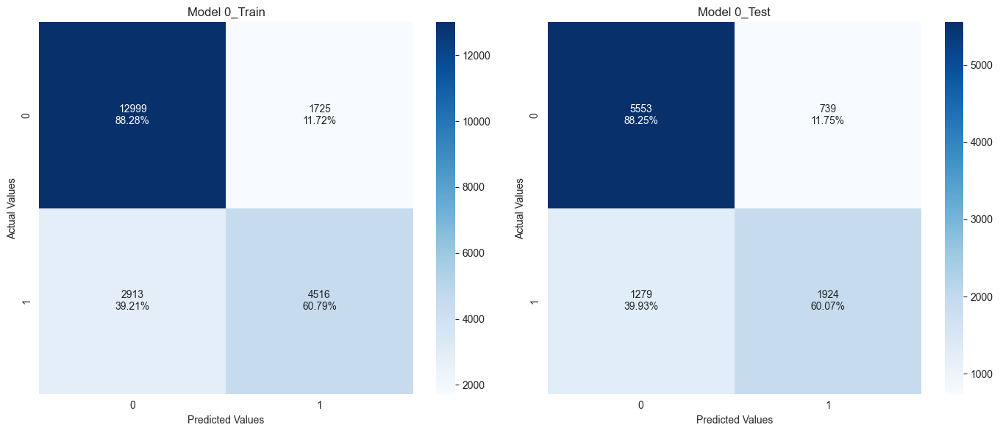

In [349]:
plot_cm_train_test(results0, X_train, y_train, X_test, y_test, train_model_desc="Model 0_Train", test_model_desc="Model 0_Test", threshold=0.5)

**Notes:**
- Initial model (Model0) created after multicollinearity check
- Model0 have an f1_score of ~0.66 and we will try to maximize it further with p-vaules

In [312]:
# initial list of columns
cols = X_train.columns.tolist()

# setting an initial max p-value
max_p_value = 1

while len(cols) > 0:
    # defining the train set
    X_train_aux = X_train[cols]

    # fitting the model
    model = sm.Logit(y_train, X_train_aux).fit(disp=False)

    # getting the p-values and the maximum p-value
    p_values = model.pvalues
    max_p_value = max(p_values)

    # name of the variable with maximum p-value
    feature_with_p_max = p_values.idxmax()

    if max_p_value > 0.05:
        cols.remove(feature_with_p_max)
    else:
        break

selected_features = cols
print(selected_features)

['const', 'no_of_weekend_nights', 'no_of_week_nights', 'lead_time', 'arrival_month', 'avg_price_per_room', 'no_of_special_requests', 'market_segment_type_Offline', 'market_segment_type_Online']


In [314]:
X_train1 = X_train[selected_features]
X_test1 = X_test[selected_features]

In [315]:
# Initialize and fit the model
model1 = sm.Logit(y_train, X_train1)
results1 = model1.fit()
print(results1.summary())   

Optimization terminated successfully.
         Current function value: 0.447779
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:         booking_status   No. Observations:                22153
Model:                          Logit   Df Residuals:                    22144
Method:                           MLE   Df Model:                            8
Date:                Fri, 28 Jun 2024   Pseudo R-squ.:                  0.2980
Time:                        13:25:33   Log-Likelihood:                -9919.6
converged:                       True   LL-Null:                       -14131.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const                          -3.4716      0.119    -29.133      0.000   

In [389]:
df_perf=model_performance(results1,X_train1,y_train,'logit_Model 1_Train',df_perf)
df_perf

,Model,Accuracy,Recall,Precision,F1
0,logit_Model 0_Train,0.79,0.61,0.72,0.66
1,logit_Model 0_Test,0.79,0.60,0.72,0.66
2,logit_Model 1_Train,0.79,0.61,0.72,0.66


In [390]:
df_perf=model_performance(results1,X_test1,y_test,'logit_Model 1_Test',df_perf)
df_perf

,Model,Accuracy,Recall,Precision,F1
0,logit_Model 0_Train,0.79,0.61,0.72,0.66
1,logit_Model 0_Test,0.79,0.60,0.72,0.66
2,logit_Model 1_Train,0.79,0.61,0.72,0.66
3,logit_Model 1_Test,0.79,0.60,0.72,0.66


In [344]:
def plot_cm_model1_model2(model1, model2, X_train1, X_train2, y_train, model1_desc="Model 1", model2_desc="Model 2", threshold=0.5):
    # Predictions for model 1
    pred1 = model1.predict(X_train1) > threshold
    pred1 = np.round(pred1)
    cm1 = confusion_matrix(y_train, pred1)

    # Predictions for model 2
    pred2 = model2.predict(X_train2) > threshold
    pred2 = np.round(pred2)
    cm2 = confusion_matrix(y_train, pred2)

    # Calculate the percentages for model 1
    cm1_percentage = cm1.astype('float') / cm1.sum(axis=1)[:, np.newaxis] * 100
    # Create labels with both counts and percentages for model 1
    labels1 = [f'{count}\n{percent:.2f}%' for count, percent in zip(cm1.flatten(), cm1_percentage.flatten())]
    labels1 = np.asarray(labels1).reshape(cm1.shape)

    # Calculate the percentages for model 2
    cm2_percentage = cm2.astype('float') / cm2.sum(axis=1)[:, np.newaxis] * 100
    # Create labels with both counts and percentages for model 2
    labels2 = [f'{count}\n{percent:.2f}%' for count, percent in zip(cm2.flatten(), cm2_percentage.flatten())]
    labels2 = np.asarray(labels2).reshape(cm2.shape)

    # Plot side by side
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    # Confusion matrix for model 1
    sns.heatmap(cm1, annot=labels1, fmt="", cmap="Blues", ax=axes[0])
    axes[0].set_title(model1_desc)
    axes[0].set_xlabel("Predicted Values")
    axes[0].set_ylabel("Actual Values")

    # Confusion matrix for model 2
    sns.heatmap(cm2, annot=labels2, fmt="", cmap="Blues", ax=axes[1])
    axes[1].set_title(model2_desc)
    axes[1].set_xlabel("Predicted Values")
    axes[1].set_ylabel("Actual Values")

    plt.tight_layout()
    plt.show()


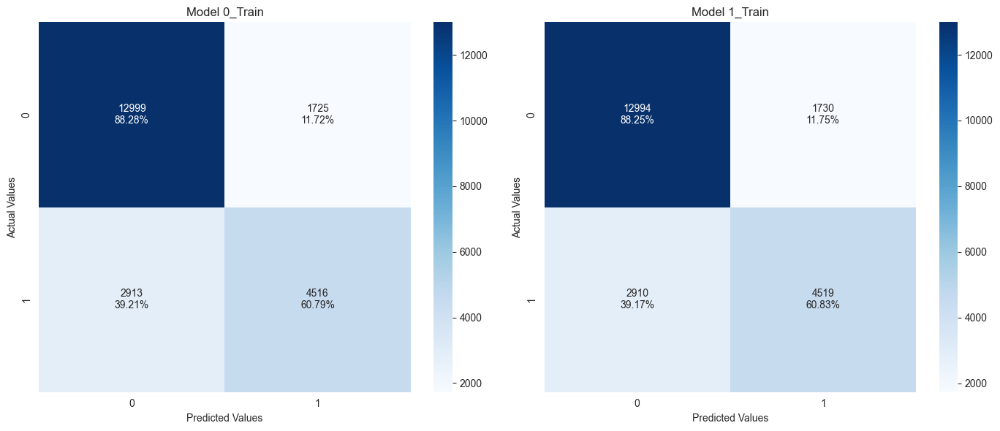

In [346]:
plot_cm_model1_model2(results0, results1, X_train, X_train1, y_train, "Model 0_Train", "Model 1_Train")

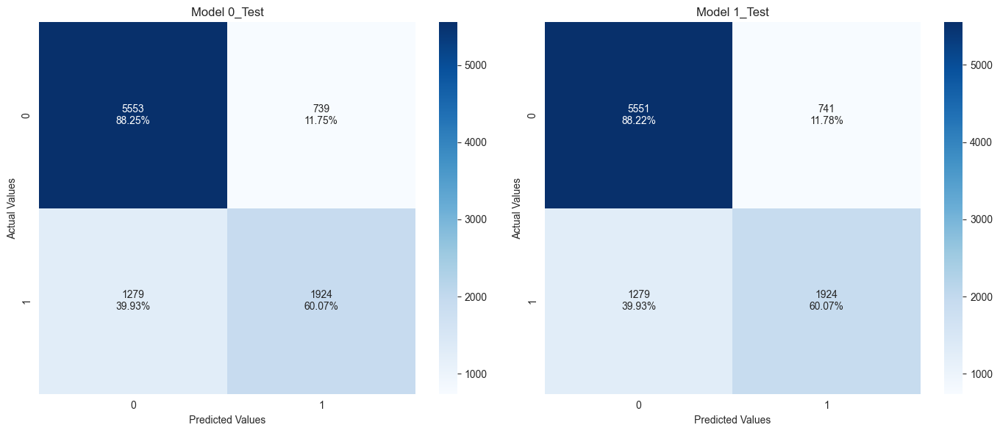

In [347]:
plot_cm_model1_model2(results0, results1, X_test, X_test1, y_test, "Model 0_Test", "Model 1_Test")

**Notes:**
- After removing high p-value variables the new model (Model1) shows no improovement on F1 score
- F1-Score might improve by selecting optimun thresdold, with ROC Curve

### Model Performance Improvement_ROC Curve

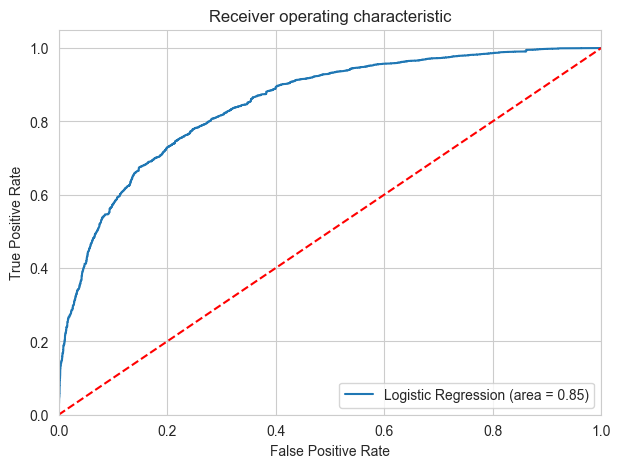

In [351]:
logit_roc_auc_train = roc_auc_score(y_train, results1.predict(X_train1))
fpr, tpr, thresholds = roc_curve(y_train, results1.predict(X_train1))
plt.figure(figsize=(7, 5))
plt.plot(fpr, tpr, label="Logistic Regression (area = %0.2f)" % logit_roc_auc_train)
plt.plot([0, 1], [0, 1], "r--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver operating characteristic")
plt.legend(loc="lower right")
plt.show()

In [353]:
# Optimal threshold as per AUC-ROC curve
# The optimal cut off would be where tpr is high and fpr is low
fpr, tpr, thresholds = roc_curve(y_train, results1.predict(X_train1))
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold_auc_roc = thresholds[optimal_idx]
print(optimal_threshold_auc_roc)

0.3480366855595747


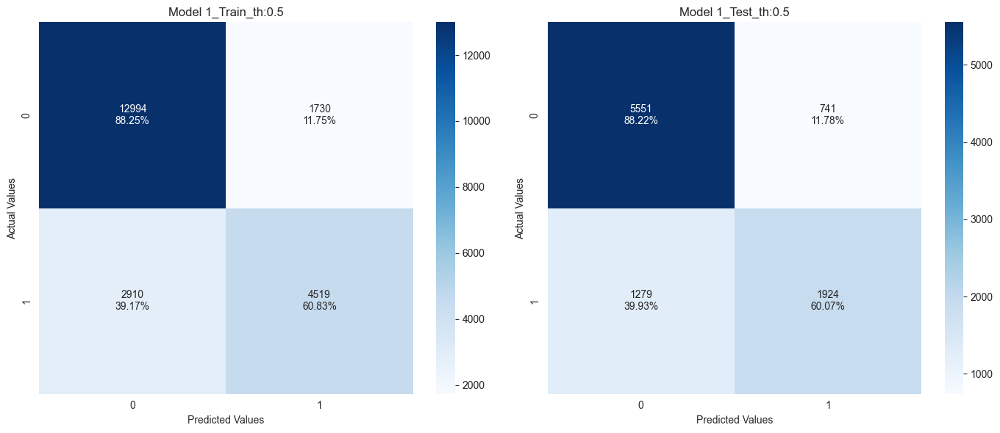

In [354]:
plot_cm_train_test(results1, X_train1, y_train, X_test1, y_test, train_model_desc="Model 1_Train_th:0.5", test_model_desc="Model 1_Test_th:0.5", threshold=0.5)

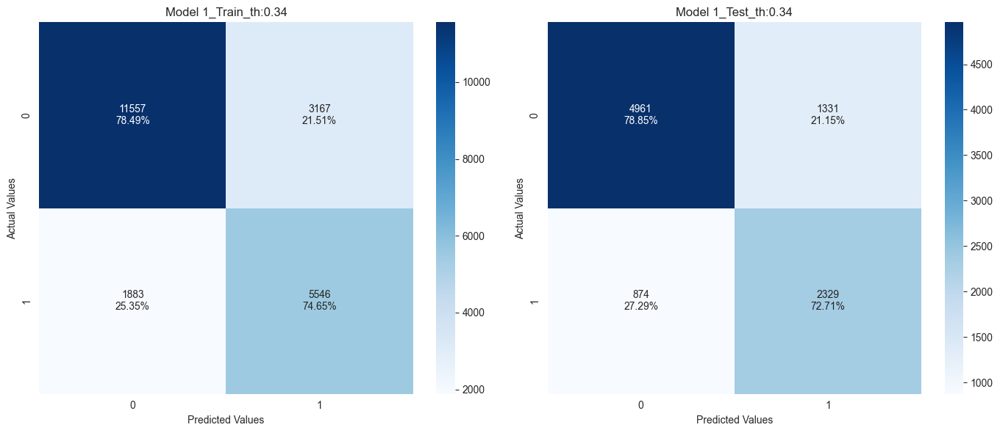

In [355]:
plot_cm_train_test(results1, X_train1, y_train, X_test1, y_test, train_model_desc="Model 1_Train_th:0.34", test_model_desc="Model 1_Test_th:0.34", threshold=optimal_threshold_auc_roc)

In [391]:
df_perf=model_performance(results1,X_train1,y_train,'logit_Model 1_Train_ROC',df_perf, threshold=optimal_threshold_auc_roc)
df_perf

,Model,Accuracy,Recall,Precision,F1
0,logit_Model 0_Train,0.79,0.61,0.72,0.66
1,logit_Model 0_Test,0.79,0.60,0.72,0.66
2,logit_Model 1_Train,0.79,0.61,0.72,0.66
3,logit_Model 1_Test,0.79,0.60,0.72,0.66
4,logit_Model 1_Train_ROC,0.77,0.75,0.64,0.69


In [392]:
df_perf=model_performance(results1,X_test1,y_test,'logit_Model 1_Test_ROC',df_perf, threshold=optimal_threshold_auc_roc)
df_perf

,Model,Accuracy,Recall,Precision,F1
0,logit_Model 0_Train,0.79,0.61,0.72,0.66
1,logit_Model 0_Test,0.79,0.60,0.72,0.66
2,logit_Model 1_Train,0.79,0.61,0.72,0.66
3,logit_Model 1_Test,0.79,0.60,0.72,0.66
4,logit_Model 1_Train_ROC,0.77,0.75,0.64,0.69
5,logit_Model 1_Test_ROC,0.77,0.73,0.64,0.68


**Notes:**
- Model1 when considered threshold from ROC curve (0.34) present a better Recall, lower Precision and a better F1-Score
- Model1 train vs test performance metrics remains coherents
- F1-Score might improve by selecting optimun thresdold, with Precision-Recall curve 

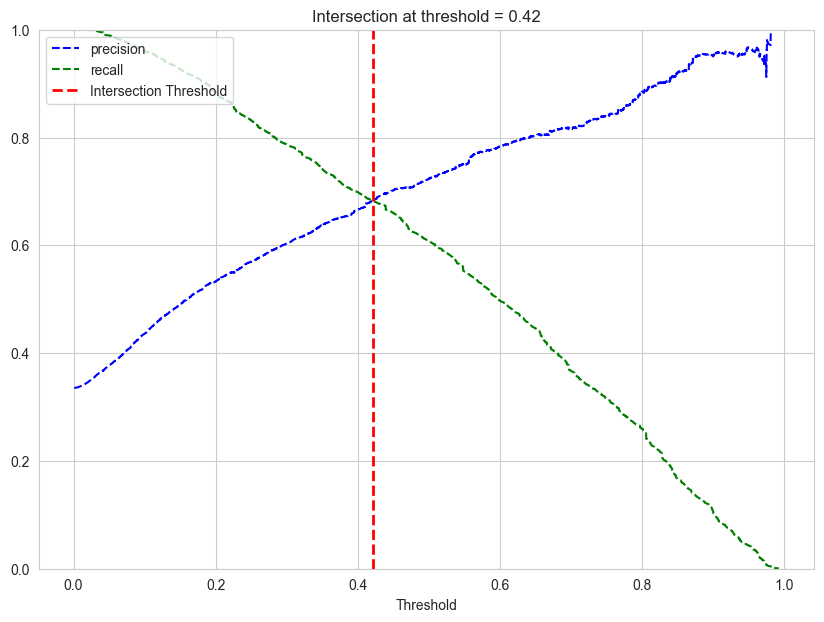

In [360]:
y_scores = results1.predict(X_train1)
prec, rec, tre = precision_recall_curve(y_train, y_scores,)

# Find the threshold where precision equals recall
intersection_idx = np.argwhere(np.diff(np.sign(prec - rec))).flatten()
intersection_threshold = tre[intersection_idx][0]

# Function to plot precision and recall vs threshold
def plot_prec_recall_vs_tresh(precisions, recalls, thresholds):
    plt.plot(thresholds, precisions[:-1], "b--", label="precision")
    plt.plot(thresholds, recalls[:-1], "g--", label="recall")
    plt.axvline(x=intersection_threshold, color='r', linestyle='--', linewidth=2, label='Intersection Threshold')
    plt.xlabel("Threshold")
    plt.legend(loc="upper left")
    plt.ylim([0, 1])
    plt.title(f'Intersection at threshold = {intersection_threshold:.2f}')


plt.figure(figsize=(10, 7))
plot_prec_recall_vs_tresh(prec, rec, tre)
plt.show()

In [361]:
intersection_threshold

0.4214926457734122

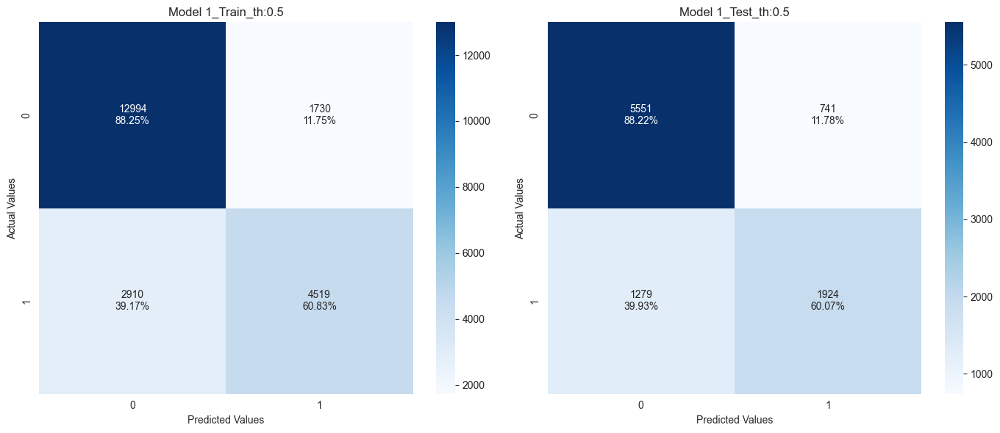

In [362]:
plot_cm_train_test(results1, X_train1, y_train, X_test1, y_test, train_model_desc="Model 1_Train_th:0.5", test_model_desc="Model 1_Test_th:0.5", threshold=0.5)

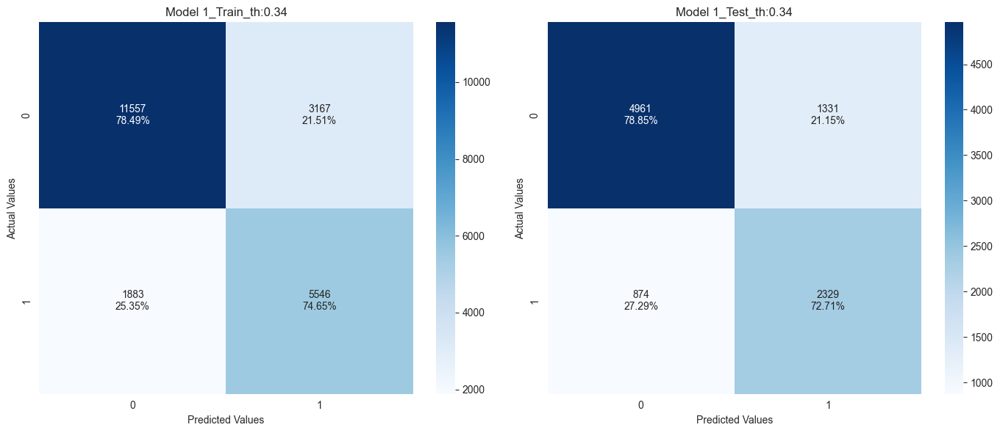

In [363]:
plot_cm_train_test(results1, X_train1, y_train, X_test1, y_test, train_model_desc="Model 1_Train_th:0.34", test_model_desc="Model 1_Test_th:0.34", threshold=optimal_threshold_auc_roc)

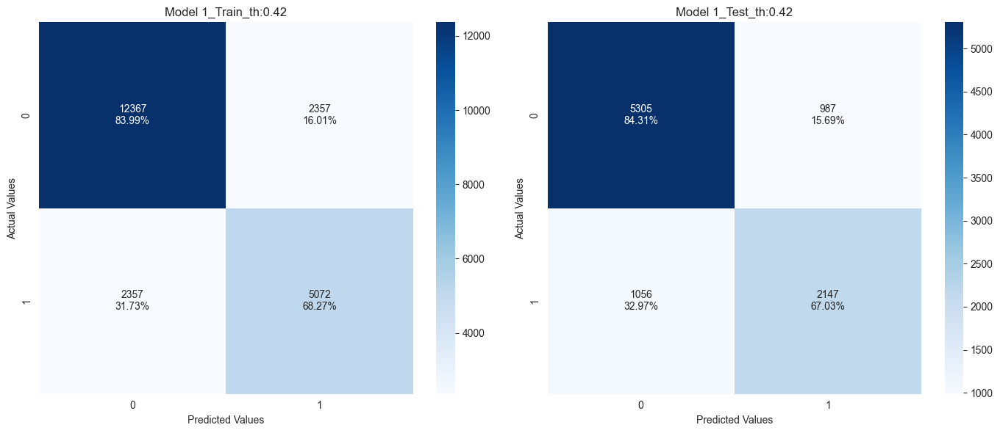

In [365]:
plot_cm_train_test(results1, X_train1, y_train, X_test1, y_test, train_model_desc="Model 1_Train_th:0.42", test_model_desc="Model 1_Test_th:0.42", threshold=intersection_threshold)

In [393]:
df_perf=model_performance(results1,X_train1,y_train,'logit_Model 1_Train_P-R',df_perf, threshold=intersection_threshold)
df_perf

,Model,Accuracy,Recall,Precision,F1
0,logit_Model 0_Train,0.79,0.61,0.72,0.66
1,logit_Model 0_Test,0.79,0.60,0.72,0.66
2,logit_Model 1_Train,0.79,0.61,0.72,0.66
3,logit_Model 1_Test,0.79,0.60,0.72,0.66
4,logit_Model 1_Train_ROC,0.77,0.75,0.64,0.69
5,logit_Model 1_Test_ROC,0.77,0.73,0.64,0.68
6,logit_Model 1_Train_P-R,0.79,0.68,0.68,0.68


In [394]:
df_perf=model_performance(results1,X_test1,y_test,'logit_Model 1_Test_P-R',df_perf, threshold=intersection_threshold)
df_perf

,Model,Accuracy,Recall,Precision,F1
0,logit_Model 0_Train,0.79,0.61,0.72,0.66
1,logit_Model 0_Test,0.79,0.60,0.72,0.66
2,logit_Model 1_Train,0.79,0.61,0.72,0.66
3,logit_Model 1_Test,0.79,0.60,0.72,0.66
4,logit_Model 1_Train_ROC,0.77,0.75,0.64,0.69
5,logit_Model 1_Test_ROC,0.77,0.73,0.64,0.68
6,logit_Model 1_Train_P-R,0.79,0.68,0.68,0.68
7,logit_Model 1_Test_P-R,0.78,0.67,0.69,0.68


**Notes:**
- Model1 when considered threshold from Precision-Recall curve (0.42) present a balanced Recall and Precision and mantains F1-Score
- Model1 with threshold 0.42 is the selected model.

## Consolidated Notes on Model performance evaluation
- Initial model (Model0) created after multicollinearity check
- Model0 have an f1_score of ~0.66 and we will try to maximize it further with p-vaules
- After removing high p-value variables the new model (Model1) shows no improvement on F1 score
- F1-Score might improve by selecting optimun thresdold, with ROC Curve
- Model1 when considered threshold from ROC curve (0.34) present a better Recall, lower Precision and a better F1-Score
- Model1 train vs test performance metrics remains coherents
- F1-Score might improve by selecting optimun thresdold, with Precision-Recall curve
- Model1 when considered threshold from Precision-Recall curve (0.42) present a balanced Recall and Precision and mantains F1-Score
- Model1 with threshold 0.42 is the selected model.

## Final Model Summary

In [375]:
print(results1.summary())

                           Logit Regression Results                           
Dep. Variable:         booking_status   No. Observations:                22153
Model:                          Logit   Df Residuals:                    22144
Method:                           MLE   Df Model:                            8
Date:                Fri, 28 Jun 2024   Pseudo R-squ.:                  0.2980
Time:                        16:31:32   Log-Likelihood:                -9919.6
converged:                       True   LL-Null:                       -14131.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const                          -3.4716      0.119    -29.133      0.000      -3.705      -3.238
no_of_weekend_nights            0.0962      0.022      4.449      0.000       0.

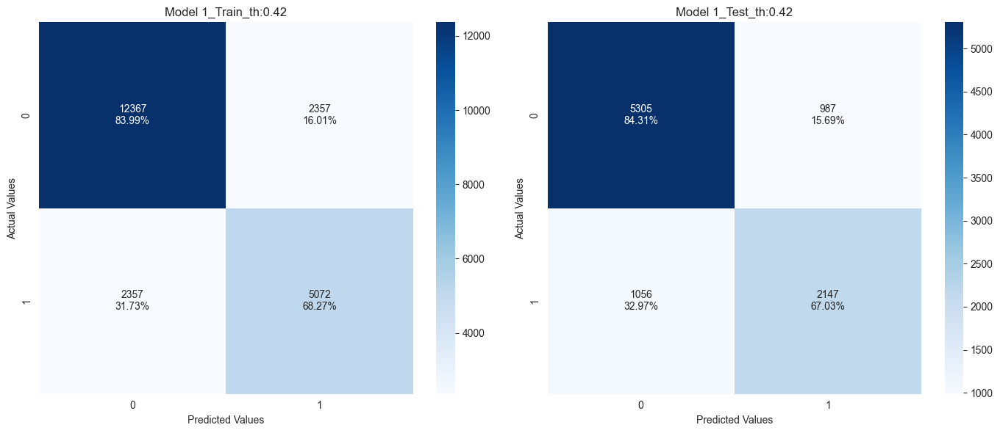

In [374]:
plot_cm_train_test(results1, X_train1, y_train, X_test1, y_test, train_model_desc="Model 1_Train_th:0.42", test_model_desc="Model 1_Test_th:0.42", threshold=intersection_threshold)

In [376]:
df_perf.tail(2)

,Model,Accuracy,Recall,Precision,F1
6,logit_Model 1_Train_P-R,0.79,0.68,0.68,0.68
7,logit_Model 1_Test_P-R,0.78,0.67,0.69,0.68


In [377]:
# converting coefficients to odds
odds = np.exp(results1.params)

# finding the percentage change
perc_change_odds = (np.exp(results.params) - 1) * 100

# removing limit from number of columns to display
pd.set_option("display.max_columns", None)

# adding the odds to a dataframe
pd.DataFrame({"Odds": odds, "Change_odd%": perc_change_odds}, index=X_train1.columns).T

,const,no_of_weekend_nights,no_of_week_nights,lead_time,arrival_month,avg_price_per_room,no_of_special_requests,market_segment_type_Offline,market_segment_type_Online
Odds,0.03,1.10,0.95,1.02,0.95,1.02,0.23,0.42,2.76
Change_odd%,-92.66,10.02,-5.13,1.67,-5.41,1.93,-77.06,-81.84,19.18


## Building a Decision Tree model

In [381]:
dTree1 = DecisionTreeClassifier(criterion = 'gini', random_state=1)
dTree1.fit(X_train1, y_train)

DecisionTreeClassifier(random_state=1)

In [383]:
print("Accuracy on training set : ",dTree1.score(X_train1, y_train))
print("Accuracy on test set : ",dTree1.score(X_test1, y_test))

Accuracy on training set :  0.9925517988534285
Accuracy on test set :  0.8523433385992628


In [398]:
df_perf=model_performance(dTree1,X_train1,y_train,'dTree_Model 1_Train_P-R',df_perf, threshold=intersection_threshold)
df_perf

,Model,Accuracy,Recall,Precision,F1
0,logit_Model 0_Train,0.79,0.61,0.72,0.66
1,logit_Model 0_Test,0.79,0.60,0.72,0.66
2,logit_Model 1_Train,0.79,0.61,0.72,0.66
3,logit_Model 1_Test,0.79,0.60,0.72,0.66
4,logit_Model 1_Train_ROC,0.77,0.75,0.64,0.69
5,logit_Model 1_Test_ROC,0.77,0.73,0.64,0.68
6,logit_Model 1_Train_P-R,0.79,0.68,0.68,0.68
7,logit_Model 1_Test_P-R,0.78,0.67,0.69,0.68
8,dTree_Model 1_Train_P-R,0.99,0.98,1.00,0.99


In [400]:
df_perf=model_performance(dTree1,X_test1,y_test,'dTree_Model 1_Test_P-R',df_perf, threshold=intersection_threshold)
df_perf

,Model,Accuracy,Recall,Precision,F1
0,logit_Model 0_Train,0.79,0.61,0.72,0.66
1,logit_Model 0_Test,0.79,0.60,0.72,0.66
2,logit_Model 1_Train,0.79,0.61,0.72,0.66
3,logit_Model 1_Test,0.79,0.60,0.72,0.66
4,logit_Model 1_Train_ROC,0.77,0.75,0.64,0.69
5,logit_Model 1_Test_ROC,0.77,0.73,0.64,0.68
6,logit_Model 1_Train_P-R,0.79,0.68,0.68,0.68
7,logit_Model 1_Test_P-R,0.78,0.67,0.69,0.68
8,dTree_Model 1_Train_P-R,0.99,0.98,1.00,0.99
9,dTree_Model 1_Test_P-R,0.85,0.78,0.78,0.78


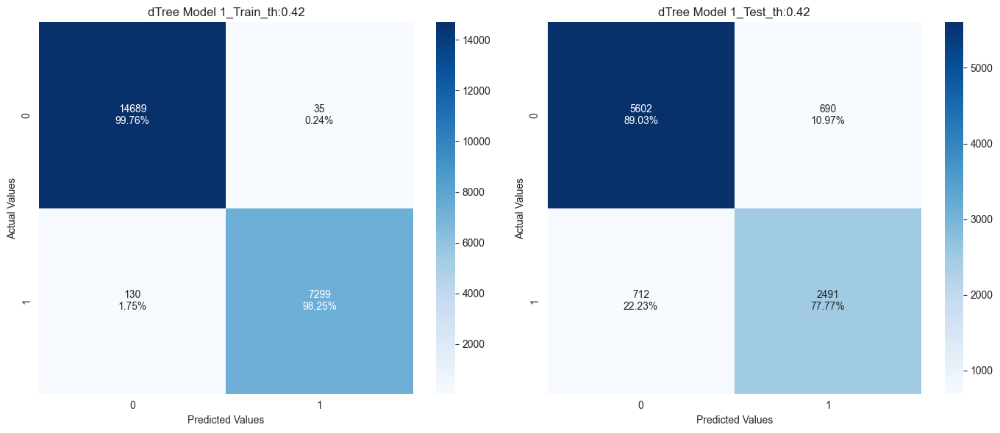

In [401]:
plot_cm_train_test(dTree1, X_train1, y_train, X_test1, y_test, train_model_desc="dTree Model 1_Train_th:0.42", test_model_desc="dTree Model 1_Test_th:0.42", threshold=intersection_threshold)

In [406]:
# decision tree feature list
column_names = list(X_train1.columns)
feature_names = column_names
print(feature_names)

['const', 'no_of_weekend_nights', 'no_of_week_nights', 'lead_time', 'arrival_month', 'avg_price_per_room', 'no_of_special_requests', 'market_segment_type_Offline', 'market_segment_type_Online']


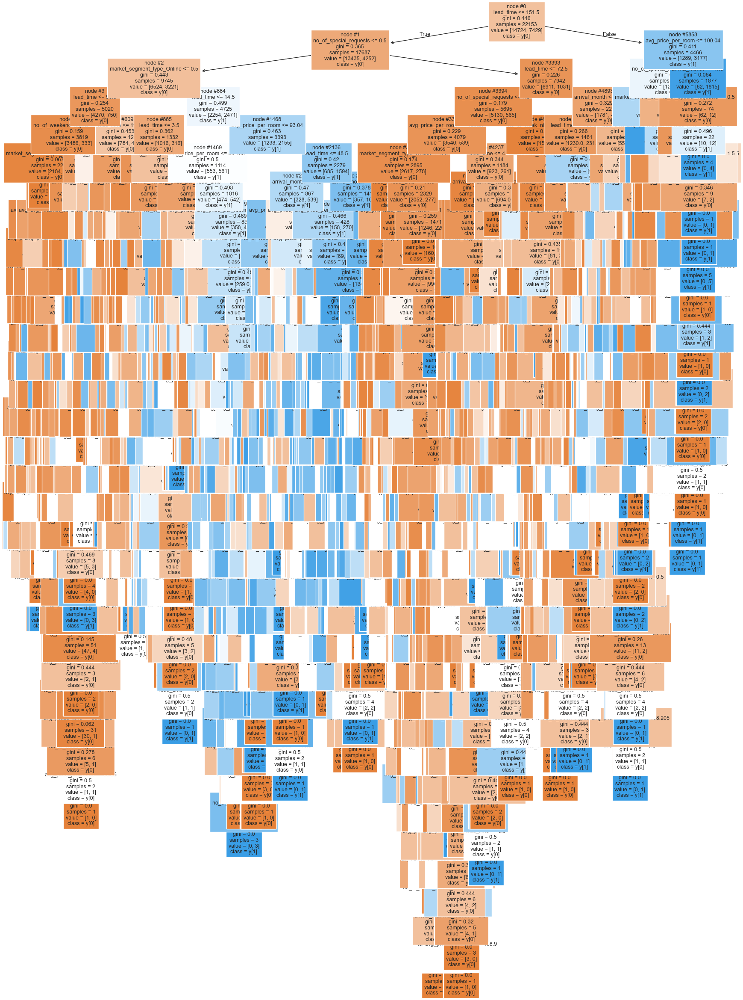

In [409]:
# decision tree plot
plt.figure(figsize=(20,30))
tree.plot_tree(dTree1,feature_names=feature_names,filled=True,fontsize=9,node_ids=True,class_names=True)
plt.show()

In [407]:
# Text report showing the rules of a decision tree -
print(tree.export_text(dTree1, feature_names=feature_names, show_weights=True))

|--- lead_time <= 151.50
|   |--- no_of_special_requests <= 0.50
|   |   |--- market_segment_type_Online <= 0.50
|   |   |   |--- lead_time <= 90.50
|   |   |   |   |--- no_of_weekend_nights <= 0.50
|   |   |   |   |   |--- market_segment_type_Offline <= 0.50
|   |   |   |   |   |   |--- lead_time <= 16.50
|   |   |   |   |   |   |   |--- avg_price_per_room <= 87.00
|   |   |   |   |   |   |   |   |--- avg_price_per_room <= 47.50
|   |   |   |   |   |   |   |   |   |--- weights: [56.00, 0.00] class: 0
|   |   |   |   |   |   |   |   |--- avg_price_per_room >  47.50
|   |   |   |   |   |   |   |   |   |--- avg_price_per_room <= 55.50
|   |   |   |   |   |   |   |   |   |   |--- lead_time <= 5.00
|   |   |   |   |   |   |   |   |   |   |   |--- weights: [1.00, 0.00] class: 0
|   |   |   |   |   |   |   |   |   |   |--- lead_time >  5.00
|   |   |   |   |   |   |   |   |   |   |   |--- weights: [0.00, 1.00] class: 1
|   |   |   |   |   |   |   |   |   |--- avg_price_per_room >  55.50
|   

In [408]:
# importance of features in the tree building ( The importance of a feature is computed as the 
#(normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )
print (pd.DataFrame(dTree1.feature_importances_, columns = ["Imp"], index = X_train1.columns).sort_values(by = 'Imp', ascending = False))


                             Imp
lead_time                   0.39
avg_price_per_room          0.24
arrival_month               0.10
market_segment_type_Online  0.10
no_of_week_nights           0.06
no_of_special_requests      0.06
no_of_weekend_nights        0.05
market_segment_type_Offline 0.00
const                       0.00


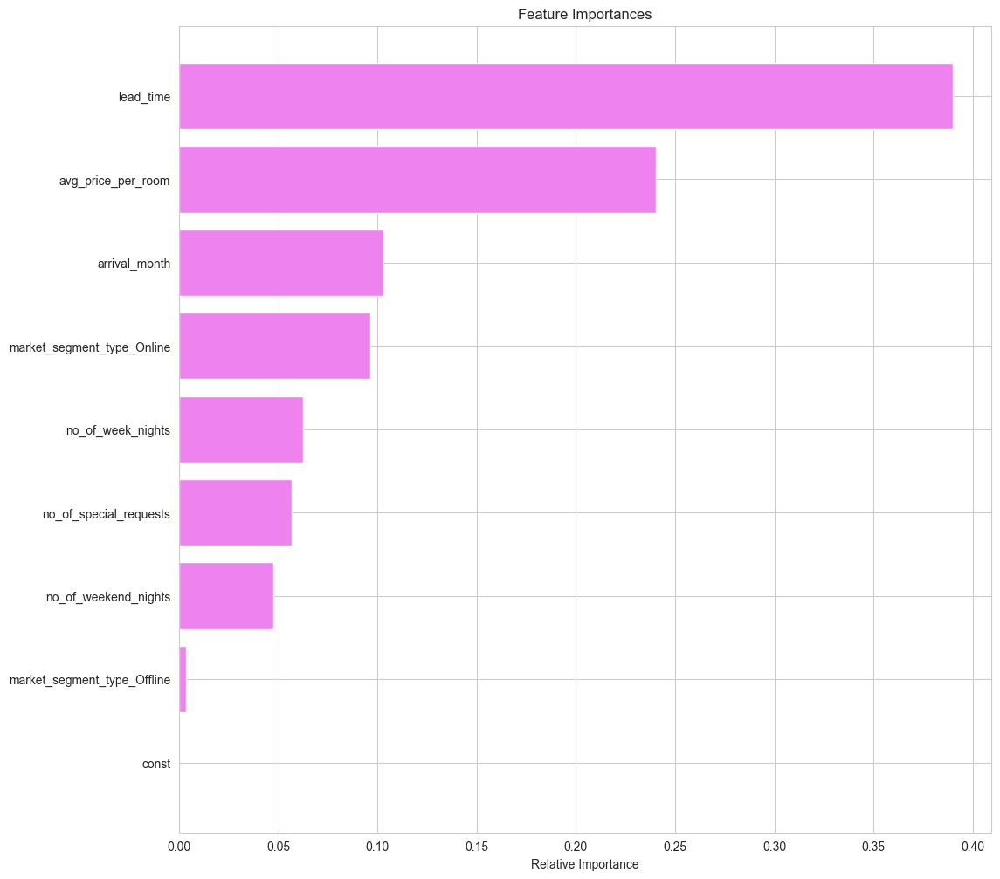

In [419]:
# Bar plot showing the importances a decision tree -
importances = dTree1.feature_importances_
indices = np.argsort(importances)
plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

## Consolidated Notes on Building a Decision Tree model

- Decision Tree with optimized model1 (threshold 0.42) present a almost perfect F1-Score for train set (0.99) but get lower on test set (0.78)
- According to the decision tree model, lead_time is the most important variable for predicting the customer default.
- The tree above is very complex, such a tree often overfits. Prune is required

## Do we need to prune the tree?

### Using GridSearch for Hyperparameter tuning  (Pre-pruning)

In [410]:
# Using GridSearch for Hyperparameter tuning of our tree mode

# Choose the type of classifier.
estimator = DecisionTreeClassifier(random_state=1)

# Grid of parameters to choose from

parameters = {
    "max_depth": np.arange(2, 7, 2),
    "max_leaf_nodes": [50, 75, 150, 250],
    "min_samples_split": [10, 30, 50, 70],
}

# Type of scoring used to compare parameter combinations
acc_scorer = make_scorer(f1_score)

# Run the grid search
grid_obj = GridSearchCV(estimator, parameters, scoring=acc_scorer, cv=5)
grid_obj = grid_obj.fit(X_train1, y_train)

# Set the clf to the best combination of parameters
estimator = grid_obj.best_estimator_

# Fit the best algorithm to the data.
estimator.fit(X_train1, y_train)

DecisionTreeClassifier(max_depth=6, max_leaf_nodes=75, min_samples_split=10,
                       random_state=1)

In [415]:
df_perf=model_performance(estimator,X_train1,y_train,'dTree_Model 1_Train_P-R_GridSCV',df_perf, threshold=intersection_threshold)
df_perf=model_performance(estimator,X_test1,y_test,'dTree_Model 1_Test_P-R_GridSCV',df_perf, threshold=intersection_threshold)
df_perf

,Model,Accuracy,Recall,Precision,F1
0,logit_Model 0_Train,0.79,0.61,0.72,0.66
1,logit_Model 0_Test,0.79,0.60,0.72,0.66
2,logit_Model 1_Train,0.79,0.61,0.72,0.66
3,logit_Model 1_Test,0.79,0.60,0.72,0.66
4,logit_Model 1_Train_ROC,0.77,0.75,0.64,0.69
5,logit_Model 1_Test_ROC,0.77,0.73,0.64,0.68
6,logit_Model 1_Train_P-R,0.79,0.68,0.68,0.68
7,logit_Model 1_Test_P-R,0.78,0.67,0.69,0.68
8,dTree_Model 1_Train_P-R,0.99,0.98,1.00,0.99
9,dTree_Model 1_Test_P-R,0.85,0.78,0.78,0.78


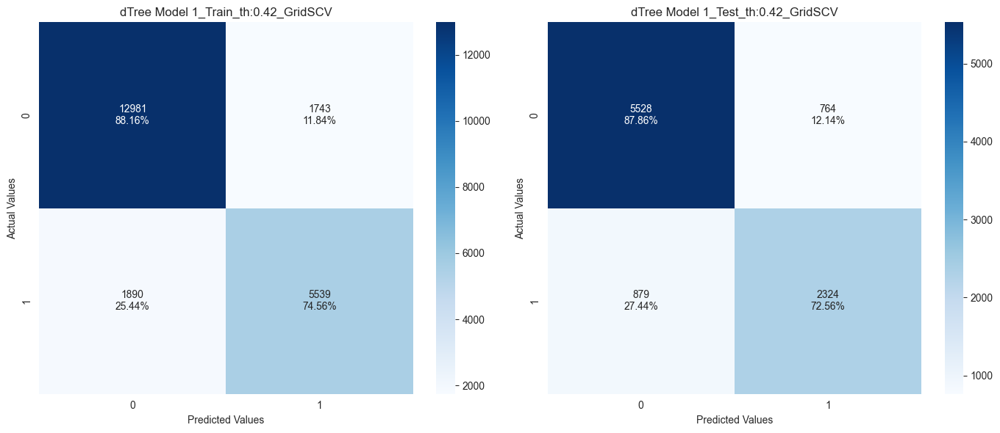

In [421]:
plot_cm_train_test(estimator, X_train1, y_train, X_test1, y_test, train_model_desc="dTree Model 1_Train_th:0.42_GridSCV", test_model_desc="dTree Model 1_Test_th:0.42_GridSCV", threshold=intersection_threshold)

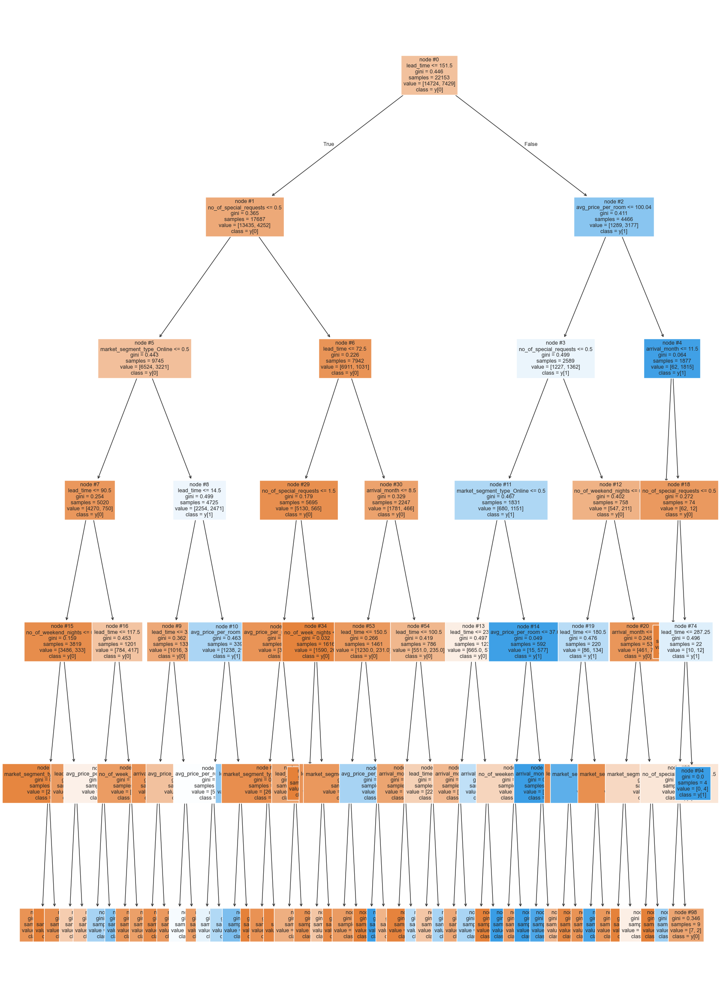

In [416]:
# decision tree plot
plt.figure(figsize=(20,30))
tree.plot_tree(estimator,feature_names=feature_names,filled=True,fontsize=9,node_ids=True,class_names=True)
plt.show()

In [417]:
# Text report showing the rules of a decision tree -
print(tree.export_text(estimator, feature_names=feature_names, show_weights=True))

|--- lead_time <= 151.50
|   |--- no_of_special_requests <= 0.50
|   |   |--- market_segment_type_Online <= 0.50
|   |   |   |--- lead_time <= 90.50
|   |   |   |   |--- no_of_weekend_nights <= 0.50
|   |   |   |   |   |--- market_segment_type_Offline <= 0.50
|   |   |   |   |   |   |--- weights: [558.00, 79.00] class: 0
|   |   |   |   |   |--- market_segment_type_Offline >  0.50
|   |   |   |   |   |   |--- weights: [1626.00, 0.00] class: 0
|   |   |   |   |--- no_of_weekend_nights >  0.50
|   |   |   |   |   |--- lead_time <= 65.50
|   |   |   |   |   |   |--- weights: [1114.00, 141.00] class: 0
|   |   |   |   |   |--- lead_time >  65.50
|   |   |   |   |   |   |--- weights: [188.00, 113.00] class: 0
|   |   |   |--- lead_time >  90.50
|   |   |   |   |--- lead_time <= 117.50
|   |   |   |   |   |--- avg_price_per_room <= 93.58
|   |   |   |   |   |   |--- weights: [269.00, 141.00] class: 0
|   |   |   |   |   |--- avg_price_per_room >  93.58
|   |   |   |   |   |   |--- weights: [

In [418]:
# importance of features in the tree building ( The importance of a feature is computed as the 
#(normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )
print (pd.DataFrame(estimator.feature_importances_, columns = ["Imp"], index = X_train1.columns).sort_values(by = 'Imp', ascending = False))

                             Imp
lead_time                   0.49
market_segment_type_Online  0.19
avg_price_per_room          0.13
no_of_special_requests      0.11
arrival_month               0.04
no_of_weekend_nights        0.02
no_of_week_nights           0.01
market_segment_type_Offline 0.00
const                       0.00


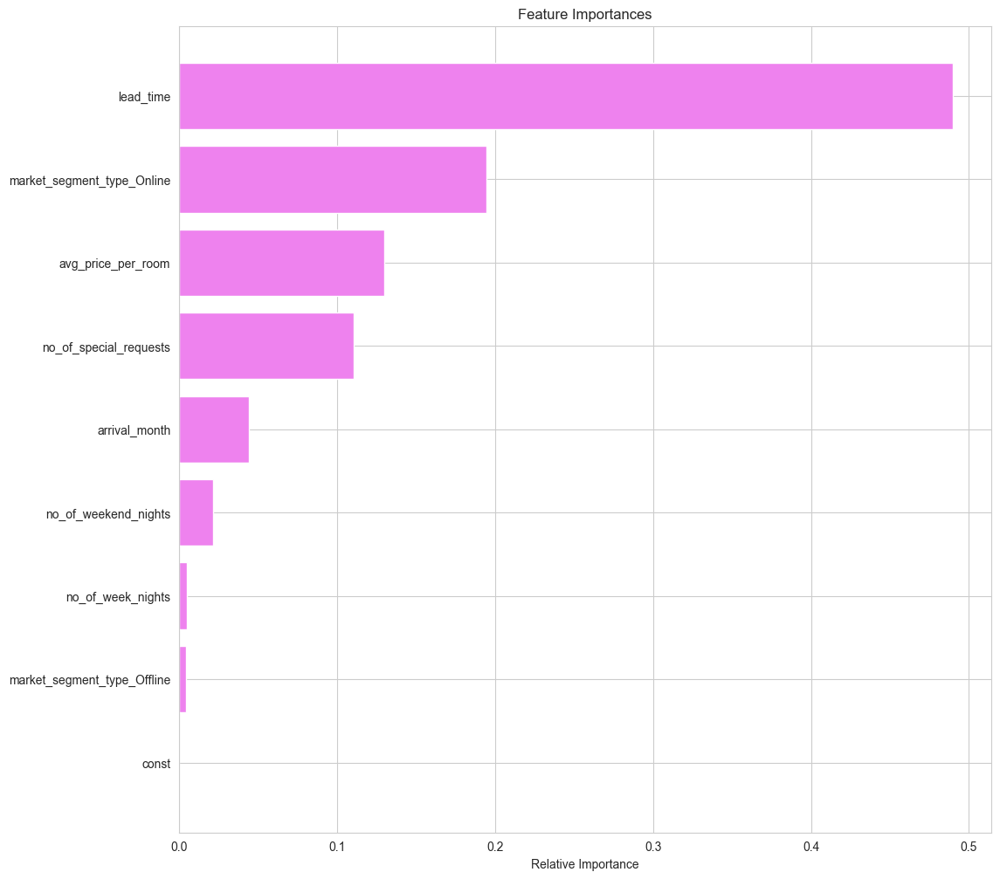

In [420]:
# Bar plot showing the importances a decision tree -
importances = estimator.feature_importances_
indices = np.argsort(importances)
plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

### Cost Complexity Pruning (Post-pruning)

In [471]:
clf = DecisionTreeClassifier(random_state=1)
path = clf.cost_complexity_pruning_path(X_train1, y_train)
ccp_alphas, impurities = abs(path.ccp_alphas), path.impurities
pd.DataFrame(path)

,ccp_alphas,impurities
0,0.00,0.01
1,0.00,0.01
2,0.00,0.01
3,0.00,0.01
4,0.00,0.01
...,...,...
1334,0.01,0.30
1335,0.01,0.31
1336,0.02,0.33
1337,0.02,0.37


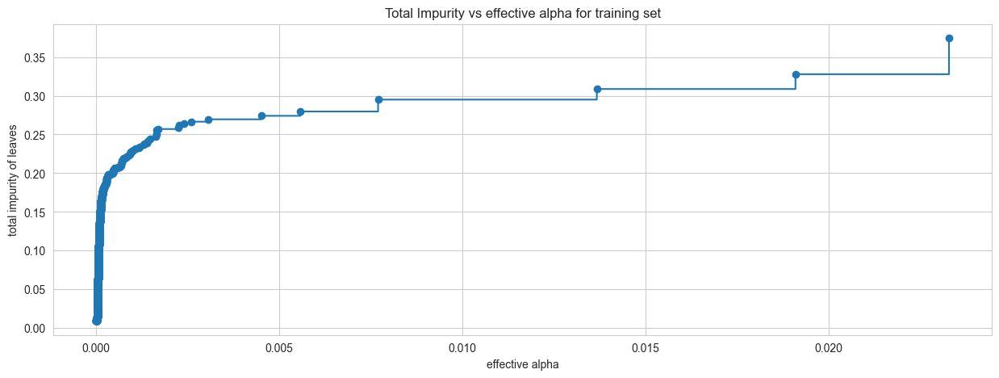

In [472]:
fig, ax = plt.subplots(figsize=(15, 5))
ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")
plt.show()

In [473]:
#train n decision trees using the effective alphas
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=1, ccp_alpha=ccp_alpha)
    clf.fit(X_train1, y_train)
    clfs.append(clf)
print(
    "Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
        clfs[-1].tree_.node_count, ccp_alphas[-1]
    )
)

Number of nodes in the last tree is: 1 with ccp_alpha: 0.0714049767438803


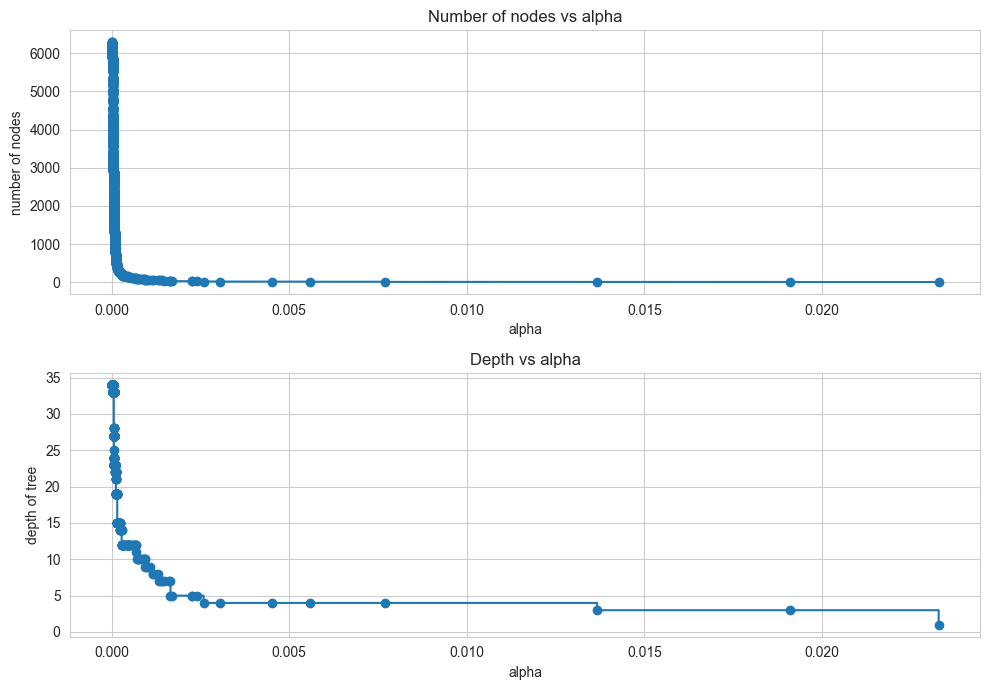

In [474]:
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1, figsize=(10, 7))
ax[0].plot(ccp_alphas, node_counts, marker="o", drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker="o", drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

In [475]:
f1_train = []
for clf in clfs:
    pred_train = clf.predict(X_train1)
    values_train = f1_score(y_train, pred_train)
    f1_train.append(values_train)

f1_test = []
for clf in clfs:
    pred_test = clf.predict(X_test1)
    values_test = f1_score(y_test, pred_test)
    f1_test.append(values_test)

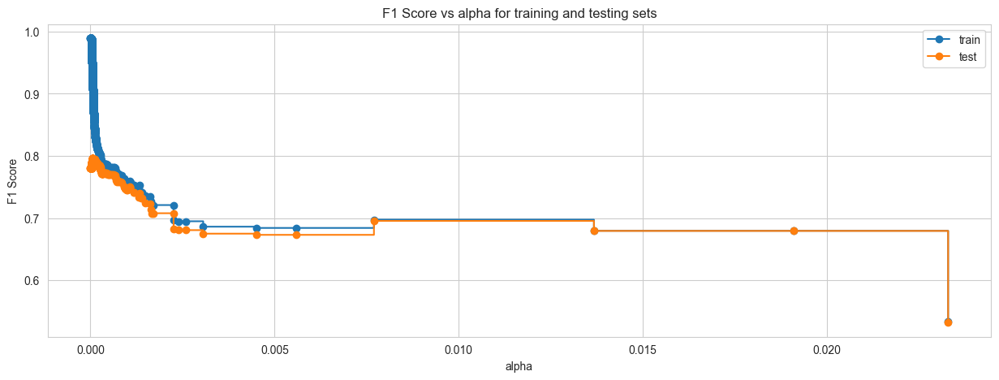

In [476]:
fig, ax = plt.subplots(figsize=(15, 5))
ax.set_xlabel("alpha")
ax.set_ylabel("F1 Score")
ax.set_title("F1 Score vs alpha for training and testing sets")
ax.plot(ccp_alphas, f1_train, marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, f1_test, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()

In [477]:
index_best_model = np.argmax(f1_test)
best_model = clfs[index_best_model]
print(best_model)

DecisionTreeClassifier(ccp_alpha=6.401759663168952e-05, random_state=1)


In [493]:
df_perf=model_performance(best_model,X_train1,y_train,'dTree_Model 1_Train_P-R_CostC',df_perf, threshold=intersection_threshold)
df_perf=model_performance(best_model,X_test1,y_test,'dTree_Model 1_Test_P-R_CostC',df_perf, threshold=intersection_threshold)
df_perf

,Model,Accuracy,Recall,Precision,F1
0,logit_Model 0_Train,0.79,0.61,0.72,0.66
1,logit_Model 0_Test,0.79,0.60,0.72,0.66
2,logit_Model 1_Train,0.79,0.61,0.72,0.66
3,logit_Model 1_Test,0.79,0.60,0.72,0.66
4,logit_Model 1_Train_ROC,0.77,0.75,0.64,0.69
5,logit_Model 1_Test_ROC,0.77,0.73,0.64,0.68
6,logit_Model 1_Train_P-R,0.79,0.68,0.68,0.68
7,logit_Model 1_Test_P-R,0.78,0.67,0.69,0.68
8,dTree_Model 1_Train_P-R,0.99,0.98,1.00,0.99
9,dTree_Model 1_Test_P-R,0.85,0.78,0.78,0.78


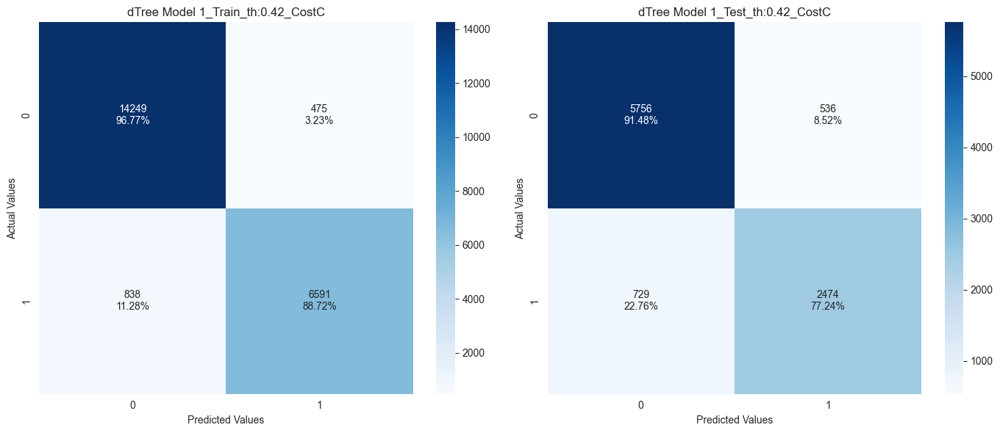

In [491]:
plot_cm_train_test(best_model, X_train1, y_train, X_test1, y_test, train_model_desc="dTree Model 1_Train_th:0.42_CostC", test_model_desc="dTree Model 1_Test_th:0.42_CostC", threshold=intersection_threshold)

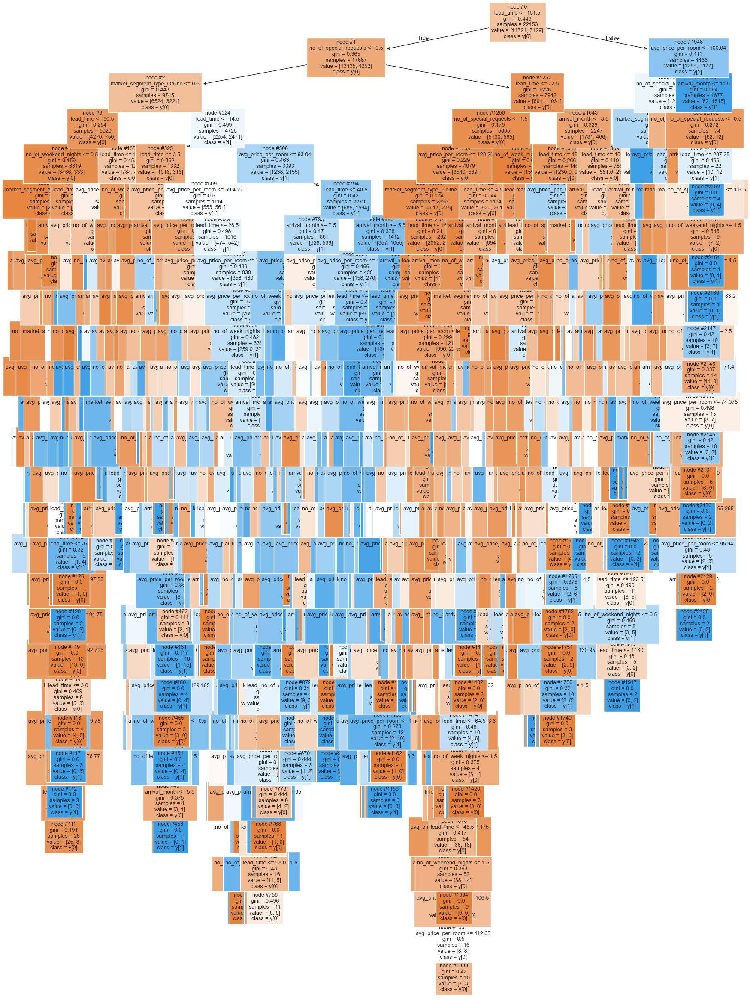

In [481]:
# decision tree plot
plt.figure(figsize=(20,30))
tree.plot_tree(best_model,feature_names=feature_names,filled=True,fontsize=9,node_ids=True,class_names=True)
plt.show()

In [487]:
# Text report showing the rules of a decision tree -
print(tree.export_text(best_model, feature_names=feature_names, show_weights=True))

|--- lead_time <= 151.50
|   |--- no_of_special_requests <= 0.50
|   |   |--- market_segment_type_Online <= 0.50
|   |   |   |--- lead_time <= 90.50
|   |   |   |   |--- no_of_weekend_nights <= 0.50
|   |   |   |   |   |--- market_segment_type_Offline <= 0.50
|   |   |   |   |   |   |--- lead_time <= 16.50
|   |   |   |   |   |   |   |--- avg_price_per_room <= 87.00
|   |   |   |   |   |   |   |   |--- weights: [261.00, 15.00] class: 0
|   |   |   |   |   |   |   |--- avg_price_per_room >  87.00
|   |   |   |   |   |   |   |   |--- lead_time <= 8.50
|   |   |   |   |   |   |   |   |   |--- no_of_week_nights <= 4.00
|   |   |   |   |   |   |   |   |   |   |--- avg_price_per_room <= 162.53
|   |   |   |   |   |   |   |   |   |   |   |--- weights: [112.00, 10.00] class: 0
|   |   |   |   |   |   |   |   |   |   |--- avg_price_per_room >  162.53
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 2
|   |   |   |   |   |   |   |   |   |--- no_of_week_nights >  4.00
| 

In [488]:
# importance of features in the tree building ( The importance of a feature is computed as the 
#(normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )
print (pd.DataFrame(best_model.feature_importances_, columns = ["Imp"], index = X_train1.columns).sort_values(by = 'Imp', ascending = False))

                             Imp
lead_time                   0.40
avg_price_per_room          0.22
market_segment_type_Online  0.12
arrival_month               0.10
no_of_special_requests      0.07
no_of_week_nights           0.04
no_of_weekend_nights        0.04
market_segment_type_Offline 0.00
const                       0.00


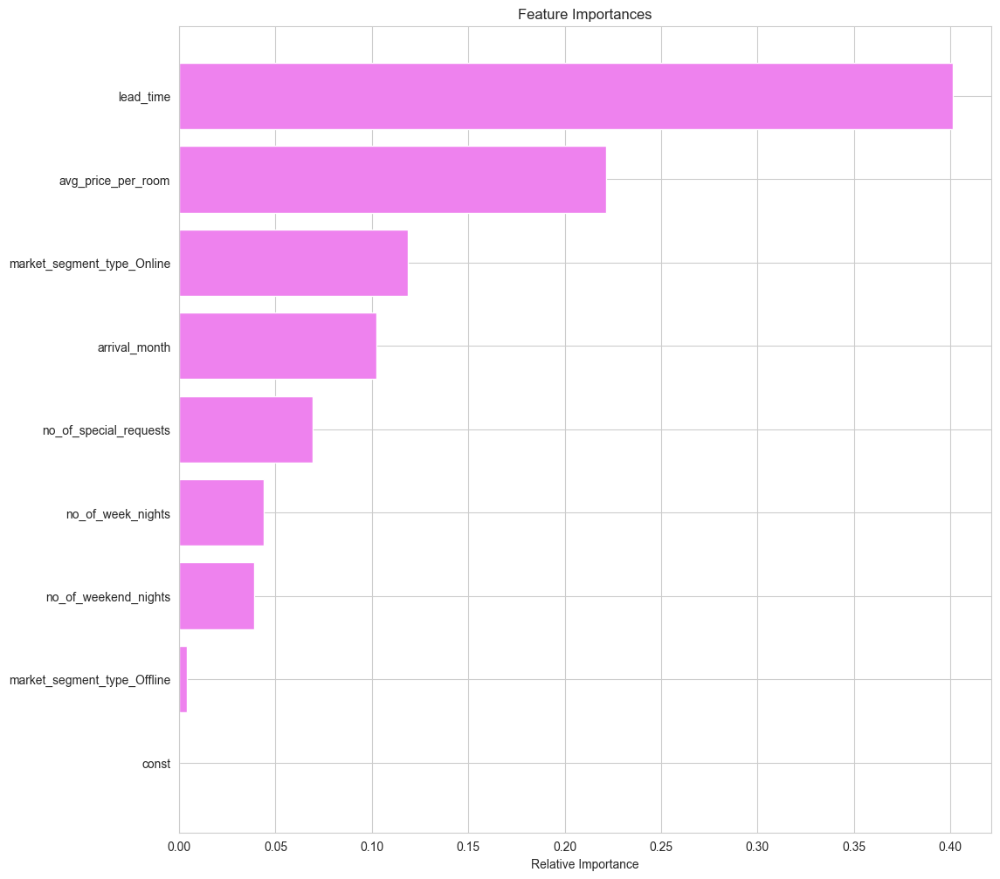

In [489]:
# Bar plot showing the importances a decision tree -
importances = best_model.feature_importances_
indices = np.argsort(importances)
plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

## Consolidated Notes on tree pruning

- The original tree is very complex. Prune is required
- After tuning hyperparameters, the performance of the model has become more generalised.
- According to the decision tree model with tuned hyperparameters, lead_time remains as the most important variable for predicting the customer default.
- The tree complexity is reduced with pre-pruning. 
- Cost Complexity Pruning should be considered.
- With Post-Pruning, tree complexity increases a to an intermediate size, and  but performance indicators getimprooved, particulary the F1-Score

## Model Performance Comparison and Conclusions

In [494]:
df_perf

,Model,Accuracy,Recall,Precision,F1
0,logit_Model 0_Train,0.79,0.61,0.72,0.66
1,logit_Model 0_Test,0.79,0.60,0.72,0.66
2,logit_Model 1_Train,0.79,0.61,0.72,0.66
3,logit_Model 1_Test,0.79,0.60,0.72,0.66
4,logit_Model 1_Train_ROC,0.77,0.75,0.64,0.69
5,logit_Model 1_Test_ROC,0.77,0.73,0.64,0.68
6,logit_Model 1_Train_P-R,0.79,0.68,0.68,0.68
7,logit_Model 1_Test_P-R,0.78,0.67,0.69,0.68
8,dTree_Model 1_Train_P-R,0.99,0.98,1.00,0.99
9,dTree_Model 1_Test_P-R,0.85,0.78,0.78,0.78


In [485]:
# Function to count nodes
def count_nodes(tree):
    tree_structure = tree.tree_
    return tree_structure.node_count


In [486]:
# Print the number of nodes
print("Number of nodes in unpruned tree:", count_nodes(dTree1))
print("Number of nodes in pre-pruned tree:", count_nodes(estimator))
print("Number of nodes in post-pruned tree:", count_nodes(best_model))

Number of nodes in unpruned tree: 6283
Number of nodes in pre-pruned tree: 103
Number of nodes in post-pruned tree: 2163


## Consolidated notes on Model Performance Comparison and Conclusions

- In this case:
    - False Positive: Predicting Not_Canceled but the reality is Canceled. False positives need to be reduced as its represent the problem scenario.
    - False Negative: Predicting Canceled, but the reality is Not_Canceled. False negatives should also be reduced, because the it might generates issues related with room overbooking
    - Then, the model performance evaluation was conducted reducing both False Negatives and False Positives, so **F1_SCORE should be maximized**
- Initially, the tree with Post-pruning is allowed to grow to its full depth, then removes nodes that do not contribute significantly to model performance. If pre-pruning was too aggressive, the post-pruned tree might end up larger because it starts from a more complex model and prunes back in a way that balances complexity and performance. This was the case on this modeling.
    - Number of nodes in unpruned tree: 6283
    - Number of nodes in pre-pruned tree: 103
    - Number of nodes in post-pruned tree: 2163
- The final model, the model with better F1-Score is the one considering Post-pruning (2163 nodes), with threshold determined with the Precision-Recall Curve (0.42)

## Actionable Insights and Recommendations

- What profitable policies for cancellations and refunds can the hotel adopt?
- What other recommedations would you suggest to the hotel?

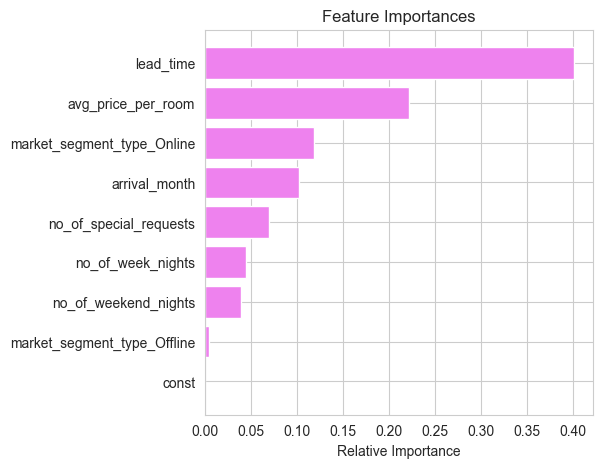

In [495]:
# Bar plot showing the importances a decision tree -
importances = best_model.feature_importances_
indices = np.argsort(importances)
plt.figure(figsize=(5, 5))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

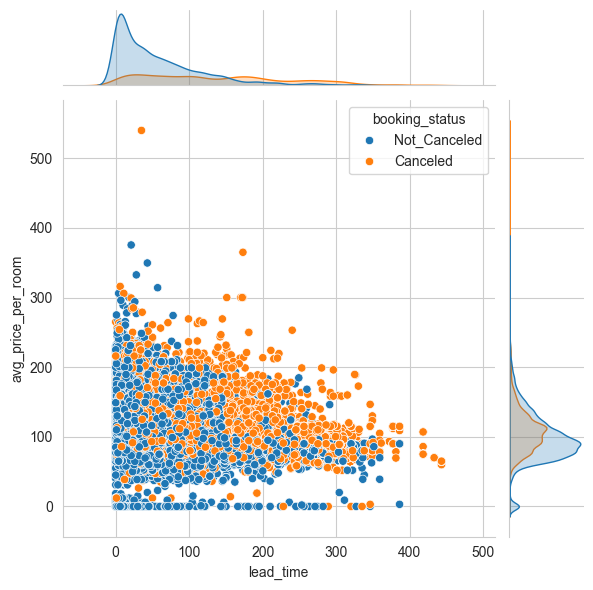

In [499]:
# Create a jointplot
sns.jointplot(data, x="lead_time", y="avg_price_per_room", hue='booking_status', kind="scatter")
# Show the plot
plt.show()

## Insights and Recommendations
- The model built can be used to predict if a booking will be cancelled or not, and can correctly identify 80% of the booking cancelations.
- lead_time and avg_price_per_room aare the most important variables in determining if a booking will be cancelled. 
    - **lead_time**: Number of days between the date of booking and the arrival date
    - **avg_price_per_room**: Average price per day of the reservation; prices of the rooms are dynamic. (in euros)
- Price strategy could be revisited, considering as base the actual prices (linked to season), and defining a "booking pricing", with some incentives for early birds, but conditioned to a deadline to either confirm the booking or get booking refund.
- Long lead times might lead to a booking cancellation for many reasons. Could be considered a reminder call to guests, before the booking deadline, to remid guess the pending action from their side to define either confirm the booking or get booking refund.

In [503]:
#convert to html
!jupyter nbconvert --to html Project_SLC_DSBA_INNHotels_FullCode.ipynb

[NbConvertApp] Converting notebook Project_SLC_DSBA_INNHotels_FullCode.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 40 image(s).
[NbConvertApp] Writing 11217550 bytes to Project_SLC_DSBA_INNHotels_FullCode.html
